In [2]:
import ee
from IPython.display import Image

# Authenticate to the Earth Engine servers
ee.Authenticate()
ee.Initialize()

Enter verification code: 4/1AQlEd8z_U1shX-V_QKo-IMdDd8MXBKyakWT_aeuO3rOsb6yblC8qi4bl8yc

Successfully saved authorization token.


Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.


Contents of indices_df:
        Date      NDVI      NDWI       GCI       MSI             Shapefile  \
0 2022-06-07  0.551246  0.316113  1.892590 -0.316113  AgriculturalLand.shp   
1 2022-06-18  0.258405  0.272823  0.797663 -0.272823  AgriculturalLand.shp   
2 2022-06-25  0.041450  0.074342  0.139462 -0.074342  AgriculturalLand.shp   
3 2022-06-28  0.417988  0.265806  1.224206 -0.265806  AgriculturalLand.shp   
4 2022-06-30  0.479550  0.228529  1.485154 -0.228529  AgriculturalLand.shp   

   Backscatter_VV  Backscatter_VH  
0             NaN             NaN  
1             NaN             NaN  
2             NaN             NaN  
3             NaN             NaN  
4             NaN             NaN  
Contents of data_df:
        Date  Temperature  DewpointTemperature  Precipitation  WindSpeed
0 2022-06-01   283.745331           280.995255   2.317131e-05   4.368973
1 2022-06-01   283.644119           280.923111   0.000000e+00   3.455900
2 2022-06-01   283.391724           280.969757   0.

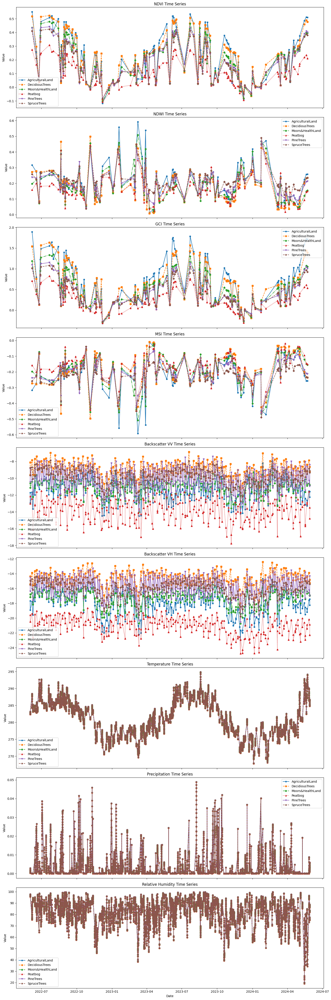

In [3]:
import geemap
import ee
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import os

# Initialize the Earth Engine module.
ee.Initialize()

# Function to calculate relative humidity
def calculate_relative_humidity(temp, dewpoint_temp):
    return 100 - 5 * (temp - dewpoint_temp)

# Define the function to calculate NDVI, NDWI, GCI, and MSI
def calculate_indices(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    ndwi = image.normalizedDifference(['B8', 'B11']).rename('NDWI')
    gci = image.expression('(NIR / GREEN) - 1', {
        'NIR': image.select('B8'),
        'GREEN': image.select('B3')
    }).rename('GCI')
    msi = image.normalizedDifference(['B11', 'B8']).rename('MSI')  # MSI calculation
    date = image.date().format('YYYY-MM-dd')
    return image.addBands([ndvi, ndwi, gci, msi]).set('date', date)

# Define the function to calculate backscatter for VV and VH
def calculate_backscatter(image):
    backscatter_vv = image.select('VV').rename('Backscatter_VV')
    backscatter_vh = image.select('VH').rename('Backscatter_VH')
    date = image.date().format('YYYY-MM-dd')
    return image.addBands([backscatter_vv, backscatter_vh]).set('date', date)

# Path to the folder containing the shapefiles.
shp_folder = 'Shapefiles/'

# List of shapefiles in the folder.
shapefiles = ['AgriculturalLand.shp', 'DecidiousTrees.shp', 'Moors&HealthLand.shp', 'Peatbog.shp', 'PineTrees.shp', 'SpruceTrees.shp']

# Function to check if the shapefile exists
def shapefile_exists(path):
    return os.path.exists(path)

# DataFrame to store indices time series.
indices_df = pd.DataFrame()

# Define the date range.
start_date = '2022-06-01'
end_date = '2024-05-31'

# Process each shapefile.
for shp in shapefiles:
    shp_path = os.path.join(shp_folder, shp)
    
    if not shapefile_exists(shp_path):
        print(f"Shapefile {shp_path} does not exist.")
        continue

    # Load the shapefile.
    shapefile_fc = geemap.shp_to_ee(shp_path)
    
    if shapefile_fc is None:
        print(f"Could not load shapefile {shp_path}.")
        continue

    geometry = shapefile_fc.geometry()

    # Load Sentinel-2 image collection, filter by cloud cover, and sort by cloud cover percentage.
    s2_collection = (ee.ImageCollection('COPERNICUS/S2')
                     .filterDate(start_date, end_date)
                     .filterBounds(geometry)
                     .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50))
                     .select(['B4', 'B8', 'B3','B11' ])
                     .map(calculate_indices))

    # Load Sentinel-1 image collection, filter by date and bounds, and get VV and VH backscatter.
    s1_collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
                     .filterDate(start_date, end_date)
                     .filterBounds(geometry)
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH'))
                     .select(['VV', 'VH'])
                     .map(calculate_backscatter))

    # Use an iterate function to get indices and backscatter values over time.
    def accumulate_indices(image, list):
        date = image.get('date')
        ndvi_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('NDVI')
        ndwi_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('NDWI')
        gci_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('GCI')
        msi_value = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('MSI')
        feature = ee.Feature(None, {'date': date, 'NDVI': ndvi_value, 'NDWI': ndwi_value, 'GCI': gci_value, 'MSI': msi_value, 'shapefile': shp})
        return ee.List(list).add(feature)

    def accumulate_backscatter(image, list):
        date = image.get('date')
        backscatter_vv = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('Backscatter_VV')
        backscatter_vh = image.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=geometry,
            scale=10
        ).get('Backscatter_VH')
        feature = ee.Feature(None, {'date': date, 'Backscatter_VV': backscatter_vv, 'Backscatter_VH': backscatter_vh, 'shapefile': shp})
        return ee.List(list).add(feature)

    initial_list = ee.List([])
    indices_time_series = ee.List(s2_collection.iterate(accumulate_indices, initial_list))
    backscatter_time_series = ee.List(s1_collection.iterate(accumulate_backscatter, initial_list))

    # Convert the lists to FeatureCollections
    indices_fc = ee.FeatureCollection(indices_time_series)
    backscatter_fc = ee.FeatureCollection(backscatter_time_series)

    # Get the indices values and dates
    indices_info = indices_fc.getInfo()
    backscatter_info = backscatter_fc.getInfo()

    for feature in indices_info['features']:
        date = feature['properties']['date']
        ndvi_value = feature['properties']['NDVI']
        ndwi_value = feature['properties']['NDWI']
        gci_value = feature['properties']['GCI']
        msi_value = feature['properties']['MSI']
        indices_df = pd.concat([indices_df, pd.DataFrame([{
            'Date': date,
            'NDVI': ndvi_value,
            'NDWI': ndwi_value,
            'GCI': gci_value,
            'MSI': msi_value,
            'Shapefile': shp
        }])], ignore_index=True)

    for feature in backscatter_info['features']:
        date = feature['properties']['date']
        backscatter_vv = feature['properties']['Backscatter_VV']
        backscatter_vh = feature['properties']['Backscatter_VH']
        indices_df = pd.concat([indices_df, pd.DataFrame([{
            'Date': date,
            'Backscatter_VV': backscatter_vv,
            'Backscatter_VH': backscatter_vh,
            'Shapefile': shp
        }])], ignore_index=True)

# Convert 'Date' column to datetime
indices_df['Date'] = pd.to_datetime(indices_df['Date'])

# Display the DataFrame to ensure data is collected
print("Contents of indices_df:")
print(indices_df.head())

# Save the indices DataFrame to a CSV file
indices_df.to_csv('indices_timeseries_with_msi_and_backscatter.csv', index=False)

# Load ERA5 data
region = ee.Geometry.Point([5.032779673636611, 61.362695116812176])
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY').filterBounds(region)

# Use an iterate function to aggregate temperature and precipitation data in smaller chunks.
data_list = []

# Define the start and end dates for the iteration
current_start_date = datetime.strptime(start_date, '%Y-%m-%d')
end_date_dt = datetime.strptime(end_date, '%Y-%m-%d')

while current_start_date < end_date_dt:
    current_end_date = current_start_date + timedelta(days=30)
    if current_end_date > end_date_dt:
        current_end_date = end_date_dt
    
    era5_filtered = era5_collection.filterDate(current_start_date.strftime('%Y-%m-%d'), current_end_date.strftime('%Y-%m-%d'))
    
    def aggregate_data(image, list):
        date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
        temp = image.select('temperature_2m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('temperature_2m')
        dewpoint_temp = image.select('dewpoint_temperature_2m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('dewpoint_temperature_2m')
        precip = image.select('total_precipitation').reduceRegion(
            reducer=ee.Reducer.sum(),
            geometry=region,
            scale=10000
        ).get('total_precipitation')
        u_wind = image.select('u_component_of_wind_10m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('u_component_of_wind_10m')
        v_wind = image.select('v_component_of_wind_10m').reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=region,
            scale=10000
        ).get('v_component_of_wind_10m')
        
        wind_speed = (ee.Number(u_wind).pow(2).add(ee.Number(v_wind).pow(2))).sqrt()
        
        feature = ee.Feature(None, {
            'date': date,
            'Temperature': temp,
            'DewpointTemperature': dewpoint_temp,
            'Precipitation': precip,
            'WindSpeed': wind_speed
        })
        return ee.List(list).add(feature)
    
    initial_list = ee.List([])
    data_time_series = ee.List(era5_filtered.iterate(aggregate_data, initial_list))
    
    # Convert the list to a FeatureCollection
    data_fc = ee.FeatureCollection(data_time_series)
    
    # Get the data values and dates
    data_info = data_fc.getInfo()
    
    # Append data to list
    for feature in data_info['features']:
        properties = feature['properties']
        data_list.append({
            'Date': properties['date'],
            'Temperature': properties['Temperature'],
            'DewpointTemperature': properties['DewpointTemperature'],
            'Precipitation': properties['Precipitation'],
            'WindSpeed': properties['WindSpeed']
        })
    
    # Move to the next time chunk
    current_start_date = current_end_date

# Create a DataFrame from the aggregated data
data_df = pd.DataFrame(data_list)

# Convert 'Date' column to datetime
data_df['Date'] = pd.to_datetime(data_df['Date'])

# Display the DataFrame to ensure data is collected
print("Contents of data_df:")
print(data_df.head())

# Save the ERA5 data to a CSV file
data_df.to_csv('era5_data_with_msi_backscatter.csv', index=False)

# Calculate relative humidity and add to the DataFrame
data_df['RelativeHumidity'] = calculate_relative_humidity(data_df['Temperature'], data_df['DewpointTemperature'])

# Merge the indices DataFrame with temperature, precipitation, wind speed, and relative humidity data.
combined_df = pd.merge(indices_df, data_df, on='Date', how='left')

# Display the combined DataFrame to ensure data is merged correctly
print("Contents of combined_df:")
print(combined_df.head())

# Save the combined DataFrame to a CSV file
combined_df.to_csv('combined_timeseries_with_msi_and_backscatter.csv', index=False)

# Directory to save plots
plot_directory = 'Indices_Plots_With_MSI_Backscatter'
os.makedirs(plot_directory, exist_ok=True)

# Define different line styles and markers
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', 'D', '^', 'v', 'P']

# Plot NDVI, NDWI, GCI, MSI, Backscatter VV, Backscatter VH, Temperature, Precipitation, and Relative Humidity time series for all shapefiles in a single figure and save as PNG
fig, axs = plt.subplots(9, 1, figsize=(15, 45), sharex=True)

shapefile_names = [os.path.splitext(shp)[0] for shp in shapefiles]

for i, shp in enumerate(shapefiles):
    shp_indices = combined_df[combined_df['Shapefile'] == shp]
    
    # Use simple names for legend
    simple_name = shapefile_names[i]
    
    # Plot NDVI, NDWI, GCI, MSI, Backscatter VV, and VH
    axs[0].plot(shp_indices['Date'], shp_indices['NDVI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[1].plot(shp_indices['Date'], shp_indices['NDWI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[2].plot(shp_indices['Date'], shp_indices['GCI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[3].plot(shp_indices['Date'], shp_indices['MSI'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[4].plot(shp_indices['Date'], shp_indices['Backscatter_VV'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[5].plot(shp_indices['Date'], shp_indices['Backscatter_VH'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    
    # Sorting for Temperature, Precipitation, and Relative Humidity
    sorted_shp_indices = shp_indices.sort_values(by='Date')
    axs[6].plot(sorted_shp_indices['Date'], sorted_shp_indices['Temperature'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[7].plot(sorted_shp_indices['Date'], sorted_shp_indices['Precipitation'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)
    axs[8].plot(sorted_shp_indices['Date'], sorted_shp_indices['RelativeHumidity'], label=simple_name, linestyle=line_styles[i % len(line_styles)], marker=markers[i % len(markers)], markersize=4)

axs[0].set_title('NDVI Time Series')
axs[1].set_title('NDWI Time Series')
axs[2].set_title('GCI Time Series')
axs[3].set_title('MSI Time Series')
axs[4].set_title('Backscatter VV Time Series')
axs[5].set_title('Backscatter VH Time Series')
axs[6].set_title('Temperature Time Series')
axs[7].set_title('Precipitation Time Series')
axs[8].set_title('Relative Humidity Time Series')

for ax in axs:
    ax.set_ylabel('Value')
    ax.legend()

axs[-1].set_xlabel('Date')

plt.tight_layout()
plt.savefig(os.path.join(plot_directory, 'Indices_Time_Series_All_Shapefiles_with_MSI_Backscatter.png'))
plt.show()


In [6]:
import pandas as pd
import numpy as np
from scipy.spatial import cKDTree

# Ensure 'Date' column is in datetime format
indices_df['Date'] = pd.to_datetime(indices_df['Date'])

# Separate Sentinel-2 (NDVI, NDWI, GCI, MSI) and Sentinel-1 (Backscatter VV, VH) data
s2_df = indices_df[['Date', 'NDVI', 'NDWI', 'GCI', 'MSI', 'Shapefile']].dropna()
s1_df = indices_df[['Date', 'Backscatter_VV', 'Backscatter_VH', 'Shapefile']].dropna()

# Initialize an empty list to store the merged results
merged_list = []

# Loop through each shapefile group
for shapefile in s2_df['Shapefile'].unique():
    # Filter data for the current shapefile
    s2_shapefile_df = s2_df[s2_df['Shapefile'] == shapefile]
    s1_shapefile_df = s1_df[s1_df['Shapefile'] == shapefile]

    # Extract unique, sorted dates for both Sentinel-2 and Sentinel-1 data
    s2_dates = s2_shapefile_df[['Date']].drop_duplicates().sort_values(by='Date').reset_index(drop=True)
    s1_dates = s1_shapefile_df[['Date']].drop_duplicates().sort_values(by='Date').reset_index(drop=True)

    # Convert dates to Unix timestamps (seconds since epoch)
    s2_timestamps = s2_dates['Date'].view(np.int64) // 10**9  # Convert to seconds
    s1_timestamps = s1_dates['Date'].view(np.int64) // 10**9  # Convert to seconds

    # Create KDTree for nearest neighbor search on dates
    tree = cKDTree(s1_timestamps.values.reshape(-1, 1))

    # Find nearest Sentinel-1 dates for each Sentinel-2 date
    _, indices = tree.query(s2_timestamps.values.reshape(-1, 1), k=1)

    # Map nearest Sentinel-1 dates to Sentinel-2 dates
    s2_dates['Nearest_S1_Date'] = s1_dates.iloc[indices.flatten()]['Date'].values

    # Merge Sentinel-2 data with nearest Sentinel-1 data based on the nearest date
    s2_merged_df = pd.merge(s2_shapefile_df, s2_dates[['Date', 'Nearest_S1_Date']], left_on='Date', right_on='Date', how='left')
    shapefile_merged_df = pd.merge(s2_merged_df, s1_shapefile_df, left_on='Nearest_S1_Date', right_on='Date', suffixes=('_S2', '_S1'))

    # Drop unnecessary columns and rename if needed
    shapefile_merged_df = shapefile_merged_df.drop(columns=['Date_S2', 'Date_S1'])

    # Append the merged data for this shapefile to the merged_list
    merged_list.append(shapefile_merged_df)

# Concatenate all shapefile-specific DataFrames into a single DataFrame
final_merged_df = pd.concat(merged_list, ignore_index=True)

# Save the merged DataFrame to a CSV file
final_merged_df.to_csv('nearest_date_merged_timeseries.csv', index=False)

# Display the DataFrame to ensure data is merged correctly
print("Contents of final_merged_df:")
print(final_merged_df.head())


Contents of final_merged_df:
       NDVI      NDWI       GCI       MSI          Shapefile_S2  \
0  0.551246  0.316113  1.892590 -0.316113  AgriculturalLand.shp   
1  0.258405  0.272823  0.797663 -0.272823  AgriculturalLand.shp   
2  0.041450  0.074342  0.139462 -0.074342  AgriculturalLand.shp   
3  0.041450  0.074342  0.139462 -0.074342  AgriculturalLand.shp   
4  0.417988  0.265806  1.224206 -0.265806  AgriculturalLand.shp   

  Nearest_S1_Date  Backscatter_VV  Backscatter_VH          Shapefile_S1  
0      2022-06-07      -11.674338      -17.781153  AgriculturalLand.shp  
1      2022-06-19       -9.604823      -15.448883  AgriculturalLand.shp  
2      2022-06-26      -11.308347      -17.182061  AgriculturalLand.shp  
3      2022-06-26      -10.800766      -16.340535  AgriculturalLand.shp  
4      2022-06-26      -11.308347      -17.182061  AgriculturalLand.shp  


In [7]:
final_merged_df

,NDVI,NDWI,GCI,MSI,Shapefile_S2,Nearest_S1_Date,Backscatter_VV,Backscatter_VH,Shapefile_S1
0,0.551246,0.316113,1.892590,-0.316113,AgriculturalLand.shp,2022-06-07,-11.674338,-17.781153,AgriculturalLand.shp
1,0.258405,0.272823,0.797663,-0.272823,AgriculturalLand.shp,2022-06-19,-9.604823,-15.448883,AgriculturalLand.shp
2,0.041450,0.074342,0.139462,-0.074342,AgriculturalLand.shp,2022-06-26,-11.308347,-17.182061,AgriculturalLand.shp
3,0.041450,0.074342,0.139462,-0.074342,AgriculturalLand.shp,2022-06-26,-10.800766,-16.340535,AgriculturalLand.shp
4,0.417988,0.265806,1.224206,-0.265806,AgriculturalLand.shp,2022-06-26,-11.308347,-17.182061,AgriculturalLand.shp
...,...,...,...,...,...,...,...,...,...
1393,0.368621,0.210172,0.910855,-0.210172,SpruceTrees.shp,2024-05-15,-8.894770,-14.683360,SpruceTrees.shp
1394,0.387842,0.232494,0.969277,-0.232494,SpruceTrees.shp,2024-05-22,-9.133887,-15.216798,SpruceTrees.shp
1395,0.387842,0.232494,0.969277,-0.232494,SpruceTrees.shp,2024-05-22,-9.487559,-15.303761,SpruceTrees.shp
1396,0.380017,0.235890,0.925874,-0.235890,SpruceTrees.shp,2024-05-22,-9.133887,-15.216798,SpruceTrees.shp


In [8]:
import pandas as pd
import ee
from datetime import timedelta, datetime

# Initialize the Earth Engine module
ee.Initialize()

# Function to aggregate ERA5 data in smaller chunks
def aggregate_era5_data_chunked(start_date, end_date, region, chunk_size_days=30):
    all_data = []
    
    # Convert start and end dates to datetime objects
    start_date_dt = datetime.strptime(start_date, '%Y-%m-%d')
    end_date_dt = datetime.strptime(end_date, '%Y-%m-%d')
    
    # Process data in chunks
    current_start_date = start_date_dt
    while current_start_date <= end_date_dt:
        current_end_date = min(current_start_date + timedelta(days=chunk_size_days - 1), end_date_dt)
        
        # Define the date range
        start_str = current_start_date.strftime('%Y-%m-%d')
        end_str = current_end_date.strftime('%Y-%m-%d')
        
        # Filter ERA5 collection by date range
        era5_collection_chunk = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY') \
            .filterBounds(region) \
            .filterDate(start_str, end_str)
        
        # Define a function to calculate daily averages
        def aggregate_data(image, list):
            date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
            u_wind = image.select('u_component_of_wind_10m').reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=region,
                scale=10000
            ).get('u_component_of_wind_10m')
            v_wind = image.select('v_component_of_wind_10m').reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=region,
                scale=10000
            ).get('v_component_of_wind_10m')
            precip = image.select('total_precipitation').reduceRegion(
                reducer=ee.Reducer.sum(),
                geometry=region,
                scale=10000
            ).get('total_precipitation')
            feature = ee.Feature(None, {'date': date, 'u_wind': u_wind, 'v_wind': v_wind, 'Precipitation': precip})
            return ee.List(list).add(feature)
        
        # Iterate over the collection
        initial_list = ee.List([])
        data_time_series = ee.List(era5_collection_chunk.iterate(aggregate_data, initial_list))
        
        # Convert the list to a FeatureCollection
        data_fc = ee.FeatureCollection(data_time_series)
        
        # Get the data values and dates
        data_info = data_fc.getInfo()
        
        # Append data to list
        for feature in data_info['features']:
            properties = feature['properties']
            all_data.append({
                'Date': properties['date'],
                'u_wind': properties['u_wind'],
                'v_wind': properties['v_wind'],
                'Precipitation': properties['Precipitation']
            })
        
        # Update current start date for next chunk
        current_start_date = current_end_date + timedelta(days=1)
    
    # Create a DataFrame from the aggregated data
    data_df = pd.DataFrame(all_data)
    
    # Convert 'Date' column to datetime
    data_df['Date'] = pd.to_datetime(data_df['Date'])
    
    return data_df

# Define region of interest
region = ee.Geometry.Point([5.032779673636611, 61.362695116812176])

# Load ERA5 data
start_date = '2022-06-01'
end_date = '2024-05-31'

# Aggregate ERA5 wind data
era5_wind_df = aggregate_era5_data_chunked(start_date, end_date, region)

# Display the aggregated ERA5 wind data
print("ERA5 Wind Data:")
print(era5_wind_df.head())

# Save the ERA5 wind data to a CSV file
era5_wind_df.to_csv('era5_wind_data.csv', index=False)


ERA5 Wind Data:
        Date    u_wind    v_wind  Precipitation
0 2022-06-01 -0.464813 -4.344177   2.317131e-05
1 2022-06-01 -0.882324 -3.341370   0.000000e+00
2 2022-06-01 -0.828369 -2.162853   0.000000e+00
3 2022-06-01 -0.471786 -1.452538   0.000000e+00
4 2022-06-01 -0.265640 -1.447382   8.568168e-07


In [9]:
import pandas as pd

# Ensure 'Date' column is in datetime format
data_df['Date'] = pd.to_datetime(data_df['Date'])

# Aggregate the weather data to daily values
aggregated_weather_df = data_df.groupby(data_df['Date'].dt.date).agg({
    'Temperature': 'mean',            # Average daily temperature
    'DewpointTemperature': 'mean',    # Average daily dewpoint
    'Precipitation': 'sum',           # Total daily precipitation
    'WindSpeed': 'mean',              # Average daily wind speed
    'RelativeHumidity': 'mean'        # Average daily relative humidity
}).reset_index()

# Convert 'Date' back to datetime for merging
aggregated_weather_df['Date'] = pd.to_datetime(aggregated_weather_df['Date'])

# Display the aggregated weather DataFrame to ensure aggregation worked
print("Aggregated Weather Data (one row per day):")
print(aggregated_weather_df.head())



Aggregated Weather Data (one row per day):
        Date  Temperature  DewpointTemperature  Precipitation  WindSpeed  \
0 2022-06-01   283.332890           281.880213       0.010852   5.041773   
1 2022-06-02   282.697495           282.041532       0.032226   4.216259   
2 2022-06-03   282.320800           280.613212       0.013356   6.438830   
3 2022-06-04   281.550916           278.632509       0.004367   4.552091   
4 2022-06-05   283.036395           279.422485       0.032017   4.927244   

   RelativeHumidity  
0         92.736616  
1         96.720184  
2         91.462059  
3         85.407966  
4         81.930450  


In [10]:
aggregated_weather_df

,Date,Temperature,DewpointTemperature,Precipitation,WindSpeed,RelativeHumidity
0,2022-06-01,283.332890,281.880213,0.010852,5.041773,92.736616
1,2022-06-02,282.697495,282.041532,0.032226,4.216259,96.720184
2,2022-06-03,282.320800,280.613212,0.013356,6.438830,91.462059
3,2022-06-04,281.550916,278.632509,0.004367,4.552091,85.407966
4,2022-06-05,283.036395,279.422485,0.032017,4.927244,81.930450
...,...,...,...,...,...,...
725,2024-05-26,288.785796,285.846197,0.017008,2.318476,85.302006
726,2024-05-27,287.873754,285.541748,0.058073,3.155295,88.339971
727,2024-05-28,286.236796,283.423080,0.040656,4.767803,85.931419
728,2024-05-29,285.799218,282.520267,0.113030,4.697707,83.605245


In [11]:
final_merged_df.rename(columns={'Nearest_S1_Date': 'Date'}, inplace=True)

In [12]:
aggregated_weather_df

,Date,Temperature,DewpointTemperature,Precipitation,WindSpeed,RelativeHumidity
0,2022-06-01,283.332890,281.880213,0.010852,5.041773,92.736616
1,2022-06-02,282.697495,282.041532,0.032226,4.216259,96.720184
2,2022-06-03,282.320800,280.613212,0.013356,6.438830,91.462059
3,2022-06-04,281.550916,278.632509,0.004367,4.552091,85.407966
4,2022-06-05,283.036395,279.422485,0.032017,4.927244,81.930450
...,...,...,...,...,...,...
725,2024-05-26,288.785796,285.846197,0.017008,2.318476,85.302006
726,2024-05-27,287.873754,285.541748,0.058073,3.155295,88.339971
727,2024-05-28,286.236796,283.423080,0.040656,4.767803,85.931419
728,2024-05-29,285.799218,282.520267,0.113030,4.697707,83.605245


In [13]:
final_merged_df

,NDVI,NDWI,GCI,MSI,Shapefile_S2,Date,Backscatter_VV,Backscatter_VH,Shapefile_S1
0,0.551246,0.316113,1.892590,-0.316113,AgriculturalLand.shp,2022-06-07,-11.674338,-17.781153,AgriculturalLand.shp
1,0.258405,0.272823,0.797663,-0.272823,AgriculturalLand.shp,2022-06-19,-9.604823,-15.448883,AgriculturalLand.shp
2,0.041450,0.074342,0.139462,-0.074342,AgriculturalLand.shp,2022-06-26,-11.308347,-17.182061,AgriculturalLand.shp
3,0.041450,0.074342,0.139462,-0.074342,AgriculturalLand.shp,2022-06-26,-10.800766,-16.340535,AgriculturalLand.shp
4,0.417988,0.265806,1.224206,-0.265806,AgriculturalLand.shp,2022-06-26,-11.308347,-17.182061,AgriculturalLand.shp
...,...,...,...,...,...,...,...,...,...
1393,0.368621,0.210172,0.910855,-0.210172,SpruceTrees.shp,2024-05-15,-8.894770,-14.683360,SpruceTrees.shp
1394,0.387842,0.232494,0.969277,-0.232494,SpruceTrees.shp,2024-05-22,-9.133887,-15.216798,SpruceTrees.shp
1395,0.387842,0.232494,0.969277,-0.232494,SpruceTrees.shp,2024-05-22,-9.487559,-15.303761,SpruceTrees.shp
1396,0.380017,0.235890,0.925874,-0.235890,SpruceTrees.shp,2024-05-22,-9.133887,-15.216798,SpruceTrees.shp


In [14]:
import pandas as pd

# Assuming final_merged_df and aggregated_weather_df are already loaded

# Ensure both DataFrames have the 'Date' column in datetime format
final_merged_df['Date'] = pd.to_datetime(final_merged_df['Date'])
aggregated_weather_df['Date'] = pd.to_datetime(aggregated_weather_df['Date'])

# Perform an inner merge on the 'Date' column to keep only rows where S1 or S2 data is available
merged_df = pd.merge(final_merged_df, aggregated_weather_df, on='Date', how='inner')

# Show the result
print("Merged DataFrame with only available S1 or S2 data:")
print(merged_df.head())

# Save the merged result to a CSV (optional)
merged_df.to_csv('merged_with_s1_s2_weather.csv', index=False)


Merged DataFrame with only available S1 or S2 data:
       NDVI      NDWI       GCI       MSI          Shapefile_S2       Date  \
0  0.551246  0.316113  1.892590 -0.316113  AgriculturalLand.shp 2022-06-07   
1  0.518549  0.272388  1.542262 -0.272388    DecidiousTrees.shp 2022-06-07   
2  0.435696  0.196818  1.187913 -0.196818  Moors&HealthLand.shp 2022-06-07   
3  0.274743  0.158326  0.710115 -0.158326           Peatbog.shp 2022-06-07   
4  0.432715  0.238482  1.095787 -0.238482         PineTrees.shp 2022-06-07   

   Backscatter_VV  Backscatter_VH          Shapefile_S1  Temperature  \
0      -11.674338      -17.781153  AgriculturalLand.shp   286.858525   
1       -7.846710      -13.891245    DecidiousTrees.shp   286.858525   
2      -10.421594      -16.583258  Moors&HealthLand.shp   286.858525   
3      -12.425577      -19.379804           Peatbog.shp   286.858525   
4      -10.244148      -16.051532         PineTrees.shp   286.858525   

   DewpointTemperature  Precipitation  WindSpe

In [15]:
merged_df

,NDVI,NDWI,GCI,MSI,Shapefile_S2,Date,Backscatter_VV,Backscatter_VH,Shapefile_S1,Temperature,DewpointTemperature,Precipitation,WindSpeed,RelativeHumidity
0,0.551246,0.316113,1.892590,-0.316113,AgriculturalLand.shp,2022-06-07,-11.674338,-17.781153,AgriculturalLand.shp,286.858525,283.239453,0.000072,5.588464,81.904640
1,0.518549,0.272388,1.542262,-0.272388,DecidiousTrees.shp,2022-06-07,-7.846710,-13.891245,DecidiousTrees.shp,286.858525,283.239453,0.000072,5.588464,81.904640
2,0.435696,0.196818,1.187913,-0.196818,Moors&HealthLand.shp,2022-06-07,-10.421594,-16.583258,Moors&HealthLand.shp,286.858525,283.239453,0.000072,5.588464,81.904640
3,0.274743,0.158326,0.710115,-0.158326,Peatbog.shp,2022-06-07,-12.425577,-19.379804,Peatbog.shp,286.858525,283.239453,0.000072,5.588464,81.904640
4,0.432715,0.238482,1.095787,-0.238482,PineTrees.shp,2022-06-07,-10.244148,-16.051532,PineTrees.shp,286.858525,283.239453,0.000072,5.588464,81.904640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1393,0.401293,0.213203,1.004559,-0.213203,PineTrees.shp,2024-05-22,-8.615353,-14.310805,PineTrees.shp,290.170500,281.843842,0.000003,4.303095,58.366706
1394,0.387842,0.232494,0.969277,-0.232494,SpruceTrees.shp,2024-05-22,-9.133887,-15.216798,SpruceTrees.shp,290.170500,281.843842,0.000003,4.303095,58.366706
1395,0.387842,0.232494,0.969277,-0.232494,SpruceTrees.shp,2024-05-22,-9.487559,-15.303761,SpruceTrees.shp,290.170500,281.843842,0.000003,4.303095,58.366706
1396,0.380017,0.235890,0.925874,-0.235890,SpruceTrees.shp,2024-05-22,-9.133887,-15.216798,SpruceTrees.shp,290.170500,281.843842,0.000003,4.303095,58.366706


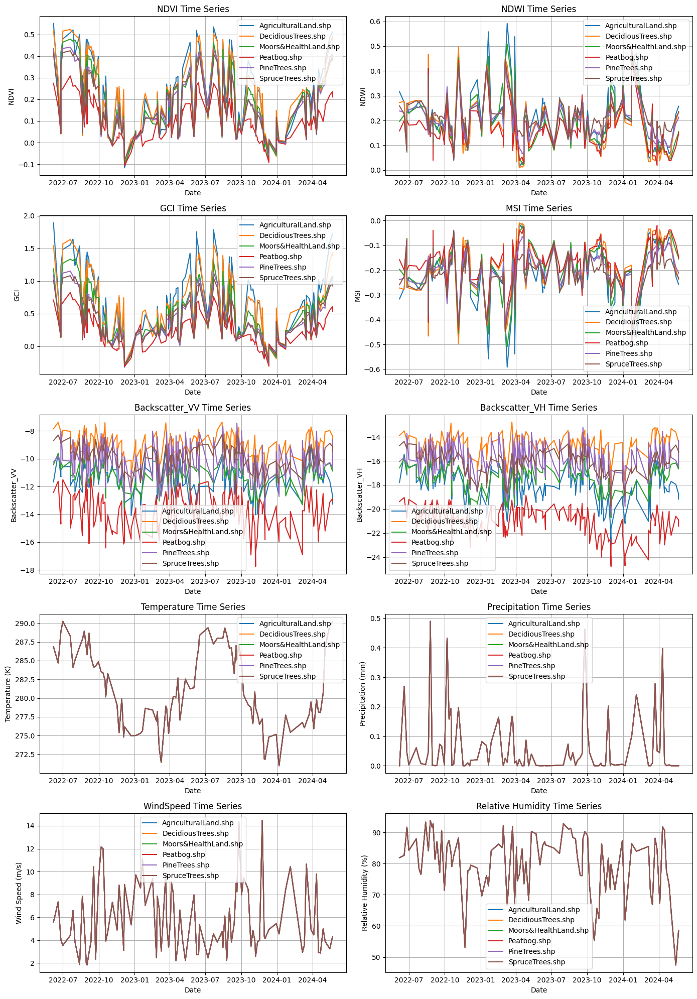

In [16]:
import matplotlib.pyplot as plt

# Plot NDVI, NDWI, GCI, and MSI
plt.figure(figsize=(14, 20))

# NDVI Time Series
plt.subplot(5, 2, 1)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['NDVI'], label=veg_type)
plt.title('NDVI Time Series')
plt.xlabel('Date')
plt.ylabel('NDVI')
plt.legend(loc='best')
plt.grid(True)

# NDWI Time Series
plt.subplot(5, 2, 2)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['NDWI'], label=veg_type)
plt.title('NDWI Time Series')
plt.xlabel('Date')
plt.ylabel('NDWI')
plt.legend(loc='best')
plt.grid(True)

# GCI Time Series
plt.subplot(5, 2, 3)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['GCI'], label=veg_type)
plt.title('GCI Time Series')
plt.xlabel('Date')
plt.ylabel('GCI')
plt.legend(loc='best')
plt.grid(True)

# MSI Time Series
plt.subplot(5, 2, 4)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['MSI'], label=veg_type)
plt.title('MSI Time Series')
plt.xlabel('Date')
plt.ylabel('MSI')
plt.legend(loc='best')
plt.grid(True)

# Backscatter_VV Time Series
plt.subplot(5, 2, 5)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['Backscatter_VV'], label=veg_type)
plt.title('Backscatter_VV Time Series')
plt.xlabel('Date')
plt.ylabel('Backscatter_VV')
plt.legend(loc='best')
plt.grid(True)

# Backscatter_VH Time Series
plt.subplot(5, 2, 6)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['Backscatter_VH'], label=veg_type)
plt.title('Backscatter_VH Time Series')
plt.xlabel('Date')
plt.ylabel('Backscatter_VH')
plt.legend(loc='best')
plt.grid(True)

# Temperature Time Series
plt.subplot(5, 2, 7)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['Temperature'], label=veg_type)
plt.title('Temperature Time Series')
plt.xlabel('Date')
plt.ylabel('Temperature (K)')
plt.legend(loc='best')
plt.grid(True)

# Precipitation Time Series
plt.subplot(5, 2, 8)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['Precipitation'], label=veg_type)
plt.title('Precipitation Time Series')
plt.xlabel('Date')
plt.ylabel('Precipitation (mm)')
plt.legend(loc='best')
plt.grid(True)

# WindSpeed Time Series
plt.subplot(5, 2, 9)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['WindSpeed'], label=veg_type)
plt.title('WindSpeed Time Series')
plt.xlabel('Date')
plt.ylabel('Wind Speed (m/s)')
plt.legend(loc='best')
plt.grid(True)

# Relative Humidity Time Series
plt.subplot(5, 2, 10)
for veg_type in merged_df['Shapefile_S2'].unique():
    veg_type_data = merged_df[merged_df['Shapefile_S2'] == veg_type]
    plt.plot(veg_type_data['Date'], veg_type_data['RelativeHumidity'], label=veg_type)
plt.title('Relative Humidity Time Series')
plt.xlabel('Date')
plt.ylabel('Relative Humidity (%)')
plt.legend(loc='best')
plt.grid(True)

plt.tight_layout()
plt.show()


## LSTM

Epoch 1/50
35/35 [==============================] - 1s 9ms/step - loss: 0.0915 - val_loss: 0.0425
Epoch 2/50
35/35 [==============================] - 0s 5ms/step - loss: 0.0349 - val_loss: 0.0323
Epoch 3/50
35/35 [==============================] - 0s 4ms/step - loss: 0.0309 - val_loss: 0.0301
Epoch 4/50
35/35 [==============================] - 0s 5ms/step - loss: 0.0294 - val_loss: 0.0308
Epoch 5/50
35/35 [==============================] - 0s 4ms/step - loss: 0.0280 - val_loss: 0.0298
Epoch 6/50
35/35 [==============================] - 0s 5ms/step - loss: 0.0277 - val_loss: 0.0285
Epoch 7/50
35/35 [==============================] - 0s 4ms/step - loss: 0.0274 - val_loss: 0.0299
Epoch 8/50
35/35 [==============================] - 0s 4ms/step - loss: 0.0265 - val_loss: 0.0291
Epoch 9/50
35/35 [==============================] - 0s 4ms/step - loss: 0.0262 - val_loss: 0.0304
Epoch 10/50
35/35 [==============================] - 0s 4ms/step - loss: 0.0254 - val_loss: 0.0317
Epoch 11/50
35/35 [

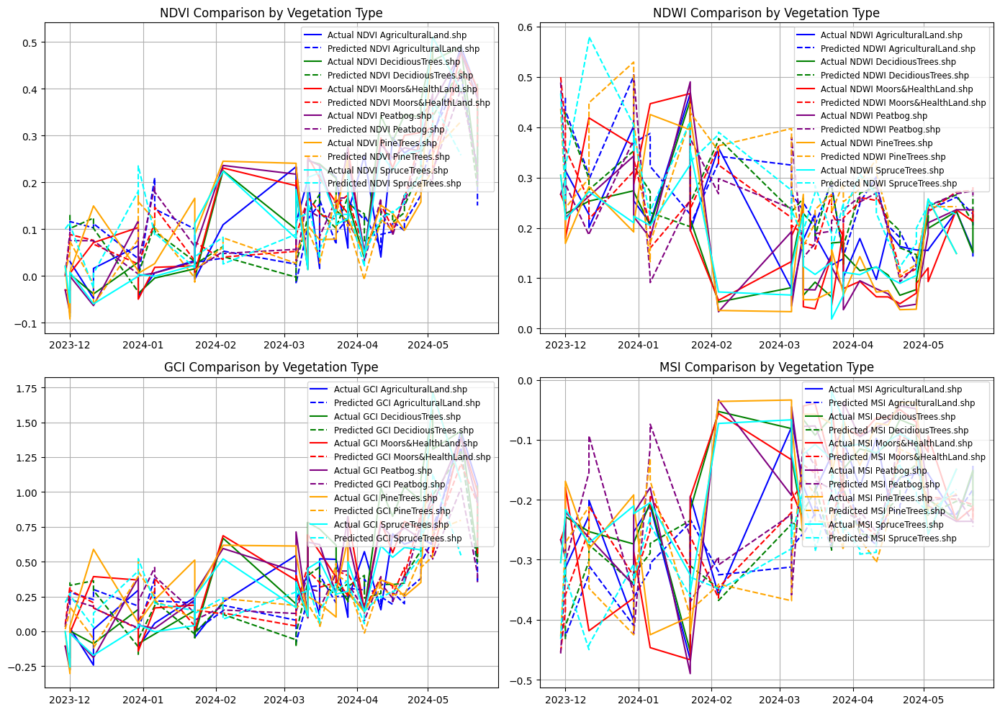

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Assume merged_df is already available from previous steps

# One-hot encode the vegetation types
encoder = OneHotEncoder(sparse_output=False)
vegetation_encoded = encoder.fit_transform(merged_df[['Shapefile_S2']])

# Add encoded vegetation types to the features
encoded_columns = [f"VegType_{i}" for i in range(vegetation_encoded.shape[1])]
merged_df[encoded_columns] = vegetation_encoded

# Feature columns (including encoded vegetation types) and target columns
feature_columns = ['Temperature', 'Precipitation', 'RelativeHumidity', 'Backscatter_VV', 'Backscatter_VH'] + encoded_columns
target_columns = ['NDVI', 'NDWI', 'GCI', 'MSI']

# Scale the features and targets
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

scaled_features = feature_scaler.fit_transform(merged_df[feature_columns])
scaled_targets = target_scaler.fit_transform(merged_df[target_columns])

# Split the data into training and testing sets (80% train, 20% test)
train_size = int(len(merged_df) * 0.8)
train_features, test_features = scaled_features[:train_size], scaled_features[train_size:]
train_targets, test_targets = scaled_targets[:train_size], scaled_targets[train_size:]

# Prepare training and testing dates
train_dates = merged_df['Date'][:train_size].reset_index(drop=True)
test_dates = merged_df['Date'][train_size:].reset_index(drop=True)

# Create time series generators for LSTM
sequence_length = 10

def create_timeseries_generator(features, targets, sequence_length):
    X, y = [], []
    for i in range(len(features) - sequence_length):
        X.append(features[i:i + sequence_length])
        y.append(targets[i + sequence_length])
    return np.array(X), np.array(y)

X_train, y_train = create_timeseries_generator(train_features, train_targets, sequence_length)
X_test, y_test = create_timeseries_generator(test_features, test_targets, sequence_length)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(y_train.shape[1]))  # Output layer for NDVI, NDWI, GCI, and MSI
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=50, validation_data=(X_test, y_test))

# Make predictions
predictions = model.predict(X_test)

# Inverse transform the target predictions
predicted_values = target_scaler.inverse_transform(predictions)
actual_values = target_scaler.inverse_transform(y_test)

# Extract NDVI, NDWI, GCI, and MSI from predictions and actual values
predicted_ndvi, predicted_ndwi, predicted_gci, predicted_msi = predicted_values.T
actual_ndvi, actual_ndwi, actual_gci, actual_msi = actual_values.T

# Calculate metrics for evaluation
metrics = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [
        mean_absolute_error(actual_ndvi, predicted_ndvi),
        mean_squared_error(actual_ndvi, predicted_ndvi, squared=False),
        mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)
    ],
    'NDWI': [
        mean_absolute_error(actual_ndwi, predicted_ndwi),
        mean_squared_error(actual_ndwi, predicted_ndwi, squared=False),
        mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)
    ],
    'GCI': [
        mean_absolute_error(actual_gci, predicted_gci),
        mean_squared_error(actual_gci, predicted_gci, squared=False),
        mean_absolute_percentage_error(actual_gci, predicted_gci)
    ],
    'MSI': [
        mean_absolute_error(actual_msi, predicted_msi),
        mean_squared_error(actual_msi, predicted_msi, squared=False),
        mean_absolute_percentage_error(actual_msi, predicted_msi)
    ]
})

print(metrics)

# Prepare test dates for plotting
test_dates = test_dates.reset_index(drop=True)[:len(actual_ndvi)]

# Define a consistent color map for vegetation types
colors = {
    'AgriculturalLand.shp': 'blue',
    'DecidiousTrees.shp': 'green',
    'Moors&HealthLand.shp': 'red',
    'Peatbog.shp': 'purple',
    'PineTrees.shp': 'orange',
    'SpruceTrees.shp': 'cyan'
}

# Create a 2x2 grid for the plots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# NDVI comparison
ax = axs[0, 0]
for veg_type in encoder.categories_[0]:
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndvi)]  # Ensure mask length matches actual/predicted length

    if np.any(veg_type_mask):  # Plot only if there is data for this vegetation type
        color = colors.get(veg_type, 'black')  # Default color if not found
        ax.plot(test_dates[veg_type_mask], actual_ndvi[veg_type_mask], label=f'Actual NDVI {veg_type}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_ndvi[veg_type_mask], label=f'Predicted NDVI {veg_type}', linestyle='--', color=color)

ax.set_title('NDVI Comparison by Vegetation Type')
ax.legend(loc='upper right', fontsize='small')
ax.grid(True)

# NDWI comparison
ax = axs[0, 1]
for veg_type in encoder.categories_[0]:
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndwi)]

    if np.any(veg_type_mask):
        color = colors.get(veg_type, 'black')
        ax.plot(test_dates[veg_type_mask], actual_ndwi[veg_type_mask], label=f'Actual NDWI {veg_type}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_ndwi[veg_type_mask], label=f'Predicted NDWI {veg_type}', linestyle='--', color=color)

ax.set_title('NDWI Comparison by Vegetation Type')
ax.legend(loc='upper right', fontsize='small')
ax.grid(True)

# GCI comparison
ax = axs[1, 0]
for veg_type in encoder.categories_[0]:
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_gci)]

    if np.any(veg_type_mask):
        color = colors.get(veg_type, 'black')
        ax.plot(test_dates[veg_type_mask], actual_gci[veg_type_mask], label=f'Actual GCI {veg_type}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_gci[veg_type_mask], label=f'Predicted GCI {veg_type}', linestyle='--', color=color)

ax.set_title('GCI Comparison by Vegetation Type')
ax.legend(loc='upper right', fontsize='small')
ax.grid(True)

# MSI comparison
ax = axs[1, 1]
for veg_type in encoder.categories_[0]:
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_msi)]

    if np.any(veg_type_mask):
        color = colors.get(veg_type, 'black')
        ax.plot(test_dates[veg_type_mask], actual_msi[veg_type_mask], label=f'Actual MSI {veg_type}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_msi[veg_type_mask], label=f'Predicted MSI {veg_type}', linestyle='--', color=color)

ax.set_title('MSI Comparison by Vegetation Type')
ax.legend(loc='upper right', fontsize='small')
ax.grid(True)

# Adjust layout to ensure plots don't overlap
plt.tight_layout()
plt.show()



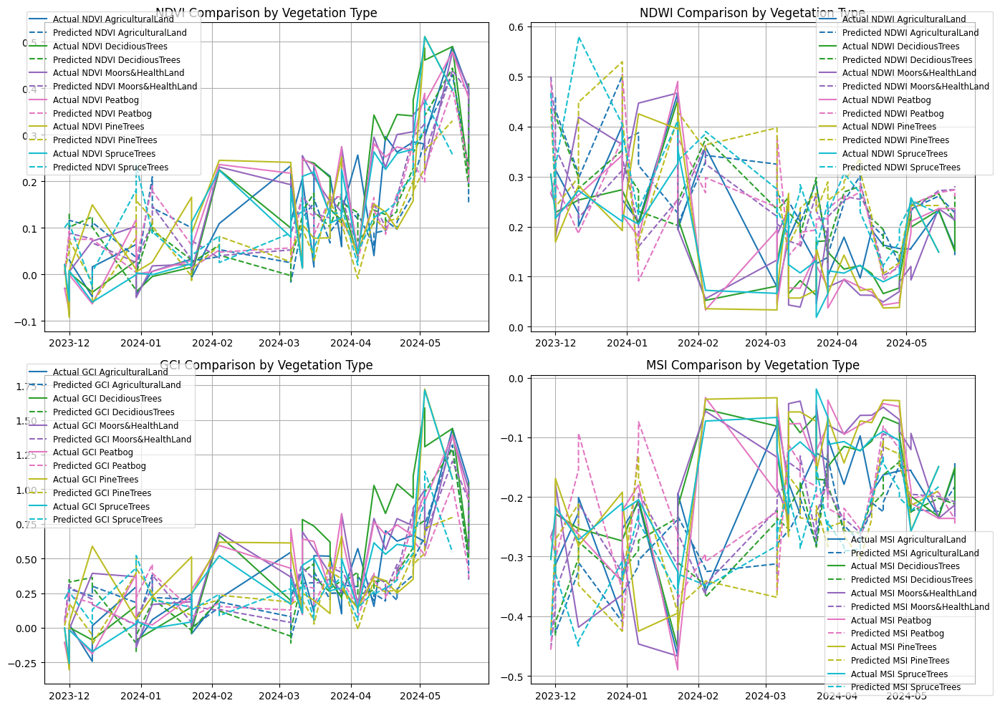

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Define consistent color map for vegetation types using matplotlib's tab10 color map
colors = plt.cm.tab10(np.linspace(0, 1, len(encoder.categories_[0])))

# Create a 2x2 grid for the plots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# NDVI comparison (Top Left, Legend in top-left)
ax = axs[0, 0]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndvi)]  # Ensure mask length matches actual/predicted length

    if np.any(veg_type_mask):  # Plot only if there is data for this vegetation type
        color = colors[i]  # Color for this vegetation type
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_ndvi[veg_type_mask], label=f'Actual NDVI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_ndvi[veg_type_mask], label=f'Predicted NDVI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('NDVI Comparison by Vegetation Type')
ax.legend(loc='upper left', bbox_to_anchor=(-0.05, 1.05), fontsize='small', framealpha=0.7)  # Set opacity with framealpha
ax.grid(True)

# NDWI comparison (Top Right, Legend in top-right)
ax = axs[0, 1]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndwi)]

    if np.any(veg_type_mask):
        color = colors[i]
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_ndwi[veg_type_mask], label=f'Actual NDWI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_ndwi[veg_type_mask], label=f'Predicted NDWI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('NDWI Comparison by Vegetation Type')
ax.legend(loc='upper right', bbox_to_anchor=(1.05, 1.05), fontsize='small', framealpha=0.7)
ax.grid(True)

# GCI comparison (Bottom Left, Legend in top-left)
ax = axs[1, 0]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_gci)]

    if np.any(veg_type_mask):
        color = colors[i]
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_gci[veg_type_mask], label=f'Actual GCI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_gci[veg_type_mask], label=f'Predicted GCI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('GCI Comparison by Vegetation Type')
ax.legend(loc='upper left', bbox_to_anchor=(-0.05, 1.05), fontsize='small', framealpha=0.7)
ax.grid(True)

# MSI comparison (Bottom Right, Legend in bottom-right)
ax = axs[1, 1]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_msi)]

    if np.any(veg_type_mask):
        color = colors[i]
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_msi[veg_type_mask], label=f'Actual MSI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_msi[veg_type_mask], label=f'Predicted MSI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('MSI Comparison by Vegetation Type')
ax.legend(loc='lower right', bbox_to_anchor=(1.05, -0.05), fontsize='small', framealpha=0.7)
ax.grid(True)

# Adjust layout to ensure plots don't overlap
plt.tight_layout()
plt.show()


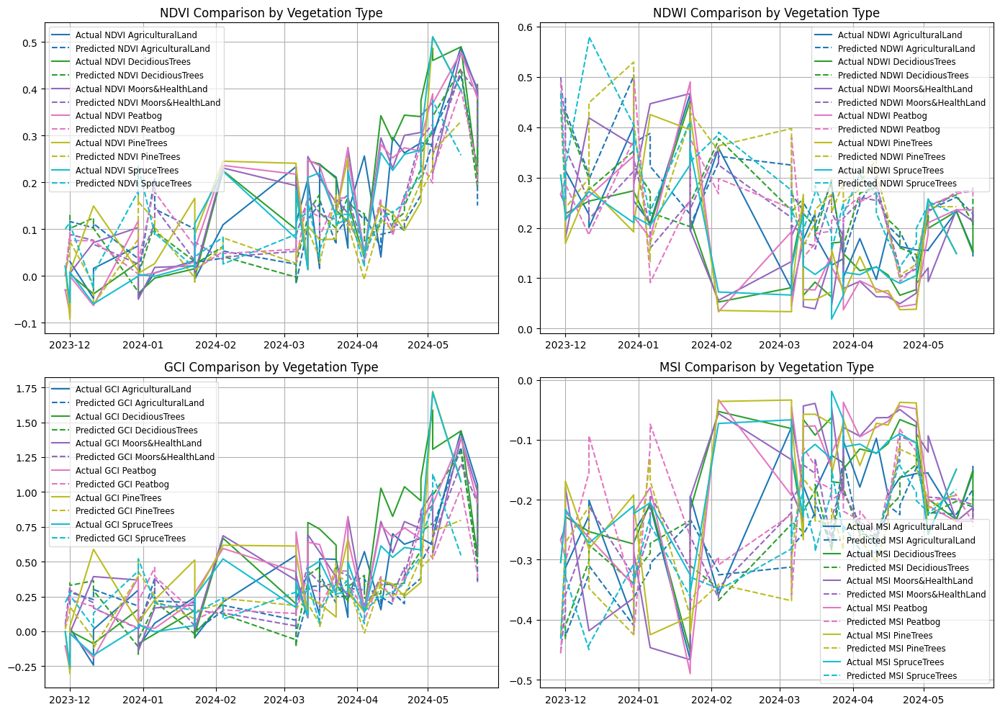

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Define consistent color map for vegetation types using matplotlib's tab10 color map
colors = plt.cm.tab10(np.linspace(0, 1, len(encoder.categories_[0])))

# Create a 2x2 grid for the plots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# NDVI comparison (Top Left)
ax = axs[0, 0]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndvi)]  # Ensure mask length matches actual/predicted length

    if np.any(veg_type_mask):  # Plot only if there is data for this vegetation type
        color = colors[i]  # Color for this vegetation type
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_ndvi[veg_type_mask], label=f'Actual NDVI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_ndvi[veg_type_mask], label=f'Predicted NDVI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('NDVI Comparison by Vegetation Type')
ax.legend(loc='upper left', bbox_to_anchor=(0, 1), fontsize='small', framealpha=0.7)  # Move legend a bit more inside
ax.grid(True)

# NDWI comparison (Top Right)
ax = axs[0, 1]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndwi)]

    if np.any(veg_type_mask):
        color = colors[i]
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_ndwi[veg_type_mask], label=f'Actual NDWI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_ndwi[veg_type_mask], label=f'Predicted NDWI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('NDWI Comparison by Vegetation Type')
ax.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='small', framealpha=0.7)
ax.grid(True)

# GCI comparison (Bottom Left)
ax = axs[1, 0]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_gci)]

    if np.any(veg_type_mask):
        color = colors[i]
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_gci[veg_type_mask], label=f'Actual GCI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_gci[veg_type_mask], label=f'Predicted GCI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('GCI Comparison by Vegetation Type')
ax.legend(loc='upper left', bbox_to_anchor=(0, 1), fontsize='small', framealpha=0.7)
ax.grid(True)

# MSI comparison (Bottom Right)
ax = axs[1, 1]
for i, veg_type in enumerate(encoder.categories_[0]):
    veg_type_mask = (merged_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_msi)]

    if np.any(veg_type_mask):
        color = colors[i]
        veg_type_clean = veg_type.replace(".shp", "")  # Remove ".shp"
        ax.plot(test_dates[veg_type_mask], actual_msi[veg_type_mask], label=f'Actual MSI {veg_type_clean}', linestyle='-', color=color)
        ax.plot(test_dates[veg_type_mask], predicted_msi[veg_type_mask], label=f'Predicted MSI {veg_type_clean}', linestyle='--', color=color)

ax.set_title('MSI Comparison by Vegetation Type')
ax.legend(loc='lower right', bbox_to_anchor=(1, 0), fontsize='small', framealpha=0.7)
ax.grid(True)

# Adjust layout to ensure plots don't overlap
plt.tight_layout()

# Save the figure as a PDF
plt.savefig("comparison_by_vegetation.pdf", format='pdf')

plt.show()


## xLSTM

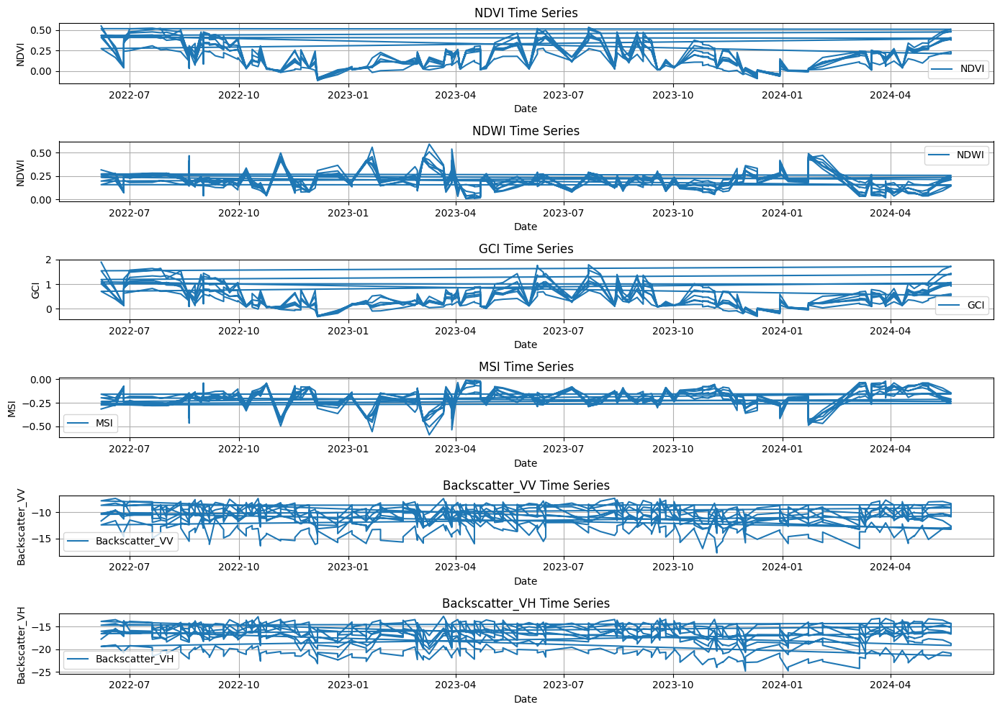

In [91]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('combined_timeseries_with_MSIandVH.csv')

# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# List of columns to plot (feel free to modify this list depending on which columns you want to visualize)
columns_to_plot = ['NDVI', 'NDWI', 'GCI', 'MSI', 'Backscatter_VV', 'Backscatter_VH']

# Plot each column against the 'Date' column
plt.figure(figsize=(14, 10))

for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(len(columns_to_plot), 1, i)
    plt.plot(df['Date'], df[col], label=col)
    plt.title(f'{col} Time Series')
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.grid(True)
    plt.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


Epoch 1/5
35/35 [==============================] - 2s 25ms/step - loss: 0.0985 - val_loss: 0.0353
Epoch 2/5
35/35 [==============================] - 1s 18ms/step - loss: 0.0399 - val_loss: 0.0295
Epoch 3/5
35/35 [==============================] - 0s 10ms/step - loss: 0.0350 - val_loss: 0.0279
Epoch 4/5
35/35 [==============================] - 1s 18ms/step - loss: 0.0339 - val_loss: 0.0280
Epoch 5/5
9/9 [==============================] - 0s 6ms/step
  Metric      NDVI      NDWI       GCI       MSI
0    MAE  0.106197  0.093534  0.253561  0.075822
1   RMSE  0.123216  0.114763  0.305616  0.091666
2   MAPE  8.237822  0.420113  1.251207  0.478404


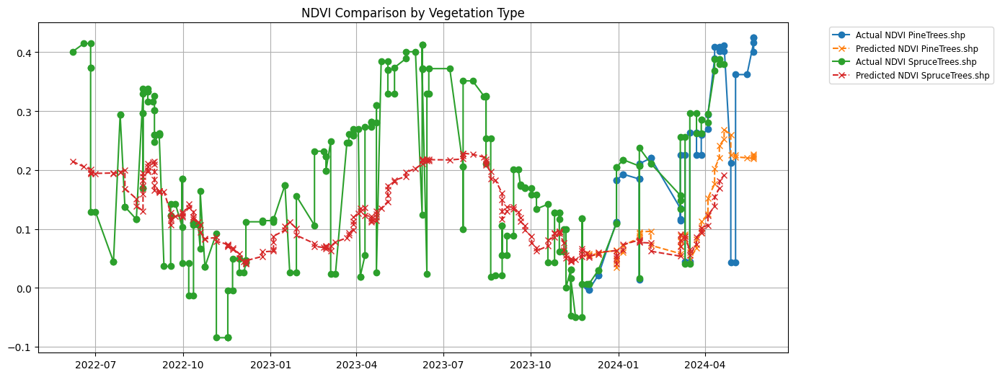

In [88]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt



# Ensure both 'Date' columns are in datetime format
final_merged_df['Date'] = pd.to_datetime(final_merged_df['Date'])
aggregated_weather_df['Date'] = pd.to_datetime(aggregated_weather_df['Date'])

# Merge the weather data with the satellite data (left join)
combined_df = pd.merge(final_merged_df, aggregated_weather_df, on='Date', how='left')

# Interpolate missing values in the satellite and weather data after merging
columns_to_interpolate = ['NDVI', 'NDWI', 'GCI', 'MSI', 'Backscatter_VV', 'Backscatter_VH', 'Temperature', 'Precipitation', 'RelativeHumidity']
combined_df[columns_to_interpolate] = combined_df[columns_to_interpolate].interpolate(method='linear')

# Fill remaining NaN values
combined_df.fillna(method='ffill', inplace=True)
combined_df.fillna(method='bfill', inplace=True)

# Encode the vegetation types (Shapefile_S2) using OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
vegetation_encoded = encoder.fit_transform(combined_df[['Shapefile_S2']])

# Add encoded vegetation types to the features
encoded_columns = [f"VegType_{i}" for i in range(vegetation_encoded.shape[1])]
combined_df[encoded_columns] = vegetation_encoded

# Define feature and target columns
feature_columns = ['Temperature', 'Precipitation', 'RelativeHumidity', 'Backscatter_VV'] + encoded_columns
target_columns = ['NDVI', 'NDWI', 'GCI', 'MSI']

# Scale the features and targets
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

scaled_features = feature_scaler.fit_transform(combined_df[feature_columns])
scaled_targets = target_scaler.fit_transform(combined_df[target_columns])

# Split the data into training and testing sets
train_size = int(len(combined_df) * 0.8)
train_features, test_features = scaled_features[:train_size], scaled_features[train_size:]
train_targets, test_targets = scaled_targets[:train_size], scaled_targets[train_size:]

# Prepare training and testing dates
train_dates = combined_df['Date'][:train_size].reset_index(drop=True)
test_dates = combined_df['Date'][train_size:].reset_index(drop=True)

# Create time series generators for LSTM
sequence_length = 10

def create_timeseries_generator(features, targets, sequence_length):
    X, y = [], []
    for i in range(len(features) - sequence_length):
        X.append(features[i:i + sequence_length])
        y.append(targets[i + sequence_length])
    return np.array(X), np.array(y)

X_train, y_train = create_timeseries_generator(train_features, train_targets, sequence_length)
X_test, y_test = create_timeseries_generator(test_features, test_targets, sequence_length)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(y_train.shape[1]))  # Output layer matching the number of target columns (4 for NDVI, NDWI, GCI, MSI)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=5, validation_data=(X_test, y_test))

# Make predictions
predictions = model.predict(X_test)

# Inverse transform only the target predictions using the target_scaler
predicted_values = target_scaler.inverse_transform(predictions)
actual_values = target_scaler.inverse_transform(y_test)

# Extract NDVI, NDWI, GCI, and MSI from predictions and actual values
predicted_ndvi, predicted_ndwi, predicted_gci, predicted_msi = predicted_values.T
actual_ndvi, actual_ndwi, actual_gci, actual_msi = actual_values.T

# Calculate metrics
metrics = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [
        mean_absolute_error(actual_ndvi, predicted_ndvi),
        mean_squared_error(actual_ndvi, predicted_ndvi, squared=False),
        mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)
    ],
    'NDWI': [
        mean_absolute_error(actual_ndwi, predicted_ndwi),
        mean_squared_error(actual_ndwi, predicted_ndwi, squared=False),
        mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)
    ],
    'GCI': [
        mean_absolute_error(actual_gci, predicted_gci),
        mean_squared_error(actual_gci, predicted_gci, squared=False),
        mean_absolute_percentage_error(actual_gci, predicted_gci)
    ],
    'MSI': [
        mean_absolute_error(actual_msi, predicted_msi),
        mean_squared_error(actual_msi, predicted_msi, squared=False),
        mean_absolute_percentage_error(actual_msi, predicted_msi)
    ]
})

print(metrics)

# Ensure the mask is applied correctly
test_dates = test_dates[:len(actual_ndvi)]

# Plot NDVI comparison by vegetation type
plt.figure(figsize=(14, 20))

# NDVI comparison
plt.subplot(4, 1, 1)
for veg_type in encoder.categories_[0]:
    # Make sure you are only applying the mask to the test set and their lengths match
    veg_type_mask = (combined_df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    
    # Adjust the mask length to match the test set
    if len(veg_type_mask) > len(actual_ndvi):
        veg_type_mask = veg_type_mask[:len(actual_ndvi)]
    
    if np.any(veg_type_mask):  # Check if there's any data for this vegetation type
        plt.plot(test_dates[veg_type_mask], actual_ndvi[veg_type_mask], 
                 label=f'Actual NDVI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_ndvi[veg_type_mask], 
                 label=f'Predicted NDVI {veg_type}', linestyle='--', marker='x')

plt.title('NDVI Comparison by Vegetation Type')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Similar comparisons for NDWI, GCI, and MSI

plt.tight_layout()
plt.show()


## LSTM

Epoch 1/5
35/35 [==============================] - 2s 20ms/step - loss: 0.0754 - val_loss: 0.0378
Epoch 2/5
35/35 [==============================] - 0s 11ms/step - loss: 0.0367 - val_loss: 0.0335
Epoch 3/5
35/35 [==============================] - 1s 15ms/step - loss: 0.0335 - val_loss: 0.0334
Epoch 4/5
35/35 [==============================] - 1s 17ms/step - loss: 0.0321 - val_loss: 0.0342
Epoch 5/5
9/9 [==============================] - 0s 6ms/step
  Metric      NDVI      NDWI       GCI       MSI
0    MAE  0.108436  0.090296  0.226909  0.095115
1   RMSE  0.127256  0.111720  0.273853  0.109908
2   MAPE  8.778230  0.415225  1.472738  0.600790


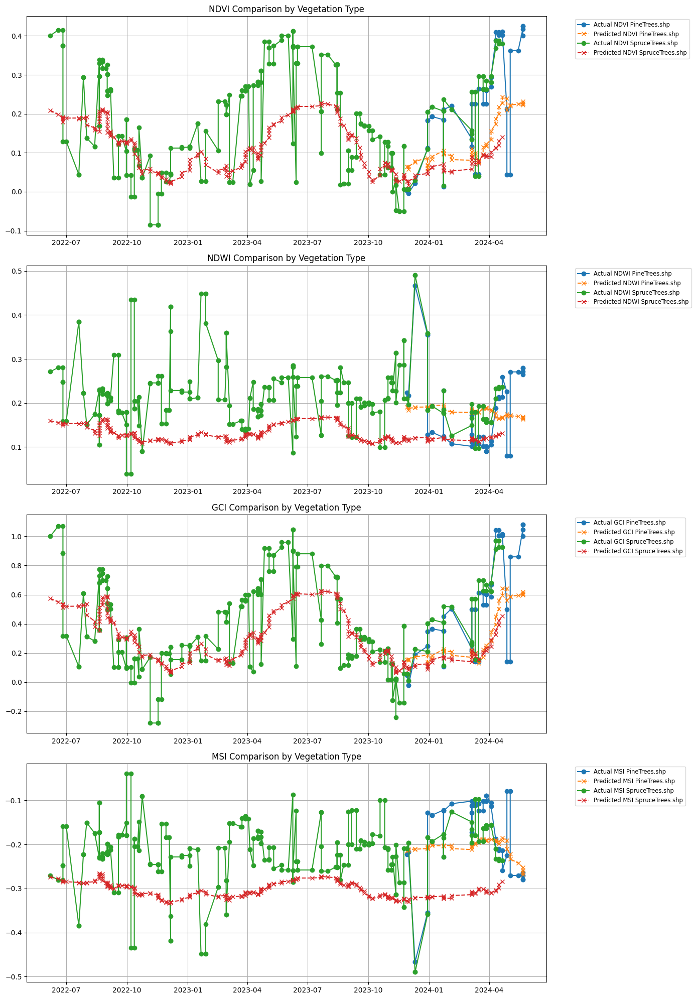

In [79]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('combined_timeseries_with_MSIandVH.csv')

# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Encode the vegetation types (Shapefile_S2) using OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
vegetation_encoded = encoder.fit_transform(df[['Shapefile_S2']])

# Add encoded vegetation types to the features
encoded_columns = [f"VegType_{i}" for i in range(vegetation_encoded.shape[1])]
df[encoded_columns] = vegetation_encoded

# Define feature and target columns
# Adding encoded vegetation type to feature columns
feature_columns = ['Temperature', 'Precipitation', 'RelativeHumidity', 'Backscatter_VV'] + encoded_columns
target_columns = ['NDVI', 'NDWI', 'GCI', 'MSI']

# Scale the features and targets
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

scaled_features = feature_scaler.fit_transform(df[feature_columns])
scaled_targets = target_scaler.fit_transform(df[target_columns])

# Split the data into training and testing sets
train_size = int(len(df) * 0.8)
train_features, test_features = scaled_features[:train_size], scaled_features[train_size:]
train_targets, test_targets = scaled_targets[:train_size], scaled_targets[train_size:]

# Prepare training and testing dates
train_dates = df['Date'][:train_size].reset_index(drop=True)
test_dates = df['Date'][train_size:].reset_index(drop=True)

# Create time series generators for LSTM
sequence_length = 10

def create_timeseries_generator(features, targets, sequence_length):
    X, y = [], []
    for i in range(len(features) - sequence_length):
        X.append(features[i:i + sequence_length])
        y.append(targets[i + sequence_length])
    return np.array(X), np.array(y)

X_train, y_train = create_timeseries_generator(train_features, train_targets, sequence_length)
X_test, y_test = create_timeseries_generator(test_features, test_targets, sequence_length)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(y_train.shape[1]))  # Output layer matching the number of target columns (4 for NDVI, NDWI, GCI, MSI)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=5, validation_data=(X_test, y_test))

# Make predictions
predictions = model.predict(X_test)

# Inverse transform only the target predictions using the target_scaler
predicted_values = target_scaler.inverse_transform(predictions)
actual_values = target_scaler.inverse_transform(y_test)

# Extract NDVI, NDWI, GCI, and MSI from predictions and actual values
predicted_ndvi, predicted_ndwi, predicted_gci, predicted_msi = predicted_values.T
actual_ndvi, actual_ndwi, actual_gci, actual_msi = actual_values.T

# Calculate metrics
metrics = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [
        mean_absolute_error(actual_ndvi, predicted_ndvi),
        mean_squared_error(actual_ndvi, predicted_ndvi, squared=False),
        mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)
    ],
    'NDWI': [
        mean_absolute_error(actual_ndwi, predicted_ndwi),
        mean_squared_error(actual_ndwi, predicted_ndwi, squared=False),
        mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)
    ],
    'GCI': [
        mean_absolute_error(actual_gci, predicted_gci),
        mean_squared_error(actual_gci, predicted_gci, squared=False),
        mean_absolute_percentage_error(actual_gci, predicted_gci)
    ],
    'MSI': [
        mean_absolute_error(actual_msi, predicted_msi),
        mean_squared_error(actual_msi, predicted_msi, squared=False),
        mean_absolute_percentage_error(actual_msi, predicted_msi)
    ]
})

print(metrics)

test_dates = test_dates.reset_index(drop=True)[:len(actual_ndvi)]

# Create subplots for each index comparison
plt.figure(figsize=(14, 20))

# NDVI comparison
plt.subplot(4, 1, 1)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    
    # Ensure the mask length matches actual_ndvi and predicted_ndvi
    veg_type_mask = veg_type_mask[:len(actual_ndvi)]
    
    if np.any(veg_type_mask):  # Check if there's any data for this vegetation type
        plt.plot(test_dates[veg_type_mask], actual_ndvi[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Actual NDVI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_ndvi[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Predicted NDVI {veg_type}', linestyle='--', marker='x')

plt.title('NDVI Comparison by Vegetation Type')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# NDWI comparison
plt.subplot(4, 1, 2)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_ndwi)]
    
    if np.any(veg_type_mask):
        plt.plot(test_dates[veg_type_mask], actual_ndwi[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Actual NDWI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_ndwi[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Predicted NDWI {veg_type}', linestyle='--', marker='x')

plt.title('NDWI Comparison by Vegetation Type')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# GCI comparison
plt.subplot(4, 1, 3)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_gci)]
    
    if np.any(veg_type_mask):
        plt.plot(test_dates[veg_type_mask], actual_gci[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Actual GCI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_gci[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Predicted GCI {veg_type}', linestyle='--', marker='x')

plt.title('GCI Comparison by Vegetation Type')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# MSI comparison
plt.subplot(4, 1, 4)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:train_size + len(test_dates)].values == veg_type)
    veg_type_mask = veg_type_mask[:len(actual_msi)]
    
    if np.any(veg_type_mask):
        plt.plot(test_dates[veg_type_mask], actual_msi[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Actual MSI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_msi[:len(veg_type_mask)][veg_type_mask], 
                 label=f'Predicted MSI {veg_type}', linestyle='--', marker='x')

plt.title('MSI Comparison by Vegetation Type')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()



IndexError: boolean index did not match indexed array along dimension 0; dimension is 270 but corresponding boolean dimension is 280

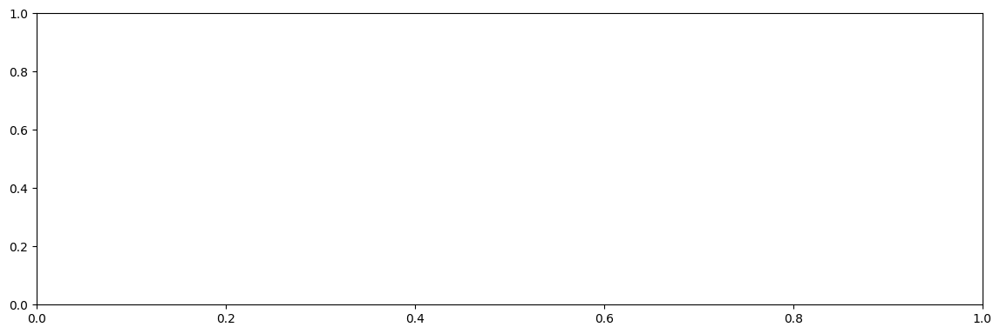

In [74]:
import matplotlib.pyplot as plt

# Ensure that the mask is applied on the correct size
test_dates = test_dates.reset_index(drop=True)

# Set the figure size
plt.figure(figsize=(14, 20))

# Subplot 1: NDVI comparison
plt.subplot(4, 1, 1)
for veg_type in encoder.categories_[0]:
    # Create a mask for the vegetation type for the test set only
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:].values == veg_type)
    
    # Ensure that the mask matches the dimensions of the test set
    if len(test_dates[veg_type_mask]) == len(actual_ndvi[veg_type_mask]):
        plt.plot(test_dates[veg_type_mask], actual_ndvi[veg_type_mask], label=f'Actual NDVI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_ndvi[veg_type_mask], label=f'Predicted NDVI {veg_type}', linestyle='--', marker='x')
plt.title('NDVI Comparison by Vegetation Type')
plt.legend()
plt.grid(True)

# Subplot 2: NDWI comparison
plt.subplot(4, 1, 2)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:].values == veg_type)
    
    if len(test_dates[veg_type_mask]) == len(actual_ndwi[veg_type_mask]):
        plt.plot(test_dates[veg_type_mask], actual_ndwi[veg_type_mask], label=f'Actual NDWI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_ndwi[veg_type_mask], label=f'Predicted NDWI {veg_type}', linestyle='--', marker='x')
plt.title('NDWI Comparison by Vegetation Type')
plt.legend()
plt.grid(True)

# Subplot 3: GCI comparison
plt.subplot(4, 1, 3)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:].values == veg_type)
    
    if len(test_dates[veg_type_mask]) == len(actual_gci[veg_type_mask]):
        plt.plot(test_dates[veg_type_mask], actual_gci[veg_type_mask], label=f'Actual GCI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_gci[veg_type_mask], label=f'Predicted GCI {veg_type}', linestyle='--', marker='x')
plt.title('GCI Comparison by Vegetation Type')
plt.legend()
plt.grid(True)

# Subplot 4: MSI comparison
plt.subplot(4, 1, 4)
for veg_type in encoder.categories_[0]:
    veg_type_mask = (df['Shapefile_S2'].iloc[train_size:].values == veg_type)
    
    if len(test_dates[veg_type_mask]) == len(actual_msi[veg_type_mask]):
        plt.plot(test_dates[veg_type_mask], actual_msi[veg_type_mask], label=f'Actual MSI {veg_type}', linestyle='-', marker='o')
        plt.plot(test_dates[veg_type_mask], predicted_msi[veg_type_mask], label=f'Predicted MSI {veg_type}', linestyle='--', marker='x')
plt.title('MSI Comparison by Vegetation Type')
plt.legend()
plt.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


C:\Users\HVL-301981\AppData\Local\Temp\ipykernel_31948\2714348317.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(shapefiles))


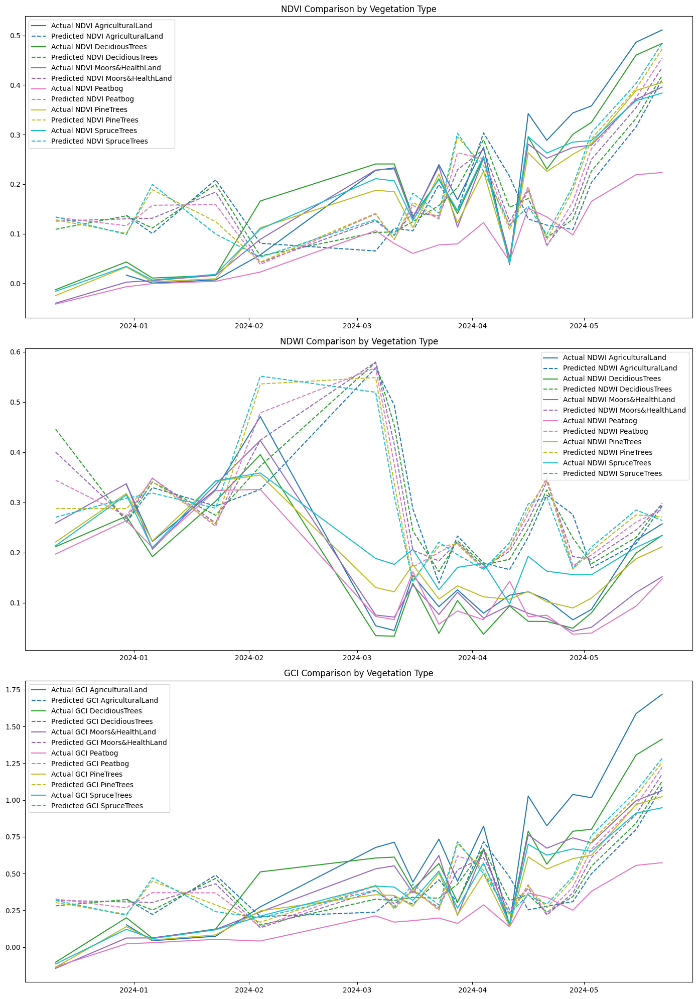

In [61]:
# Plot the results for each vegetation type separately
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 20))
colors = plt.cm.get_cmap('tab10', len(shapefiles))

# Plot NDVI, NDWI, GCI for each vegetation type
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]

    plt.subplot(3, 1, 1)
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], color=colors(i), label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted NDVI {shapefile.replace(".shp", "")}')

    plt.subplot(3, 1, 2)
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], color=colors(i), label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted NDWI {shapefile.replace(".shp", "")}')

    plt.subplot(3, 1, 3)
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], color=colors(i), label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted GCI {shapefile.replace(".shp", "")}')

plt.subplot(3, 1, 1)
plt.title('NDVI Comparison by Vegetation Type')
plt.legend()

plt.subplot(3, 1, 2)
plt.title('NDWI Comparison by Vegetation Type')
plt.legend()

plt.subplot(3, 1, 3)
plt.title('GCI Comparison by Vegetation Type')
plt.legend()

plt.tight_layout()
plt.show()


In [83]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('combined_timeseries_with_MSIandVH.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Calculate Modified FWI (MFWI)
alpha, beta, gamma = 0.1, 0.1, 0.1
#df['MFWI'] = df['FWI'] * (1 / (1 + alpha * df['NDVI'])) * (1 / (1 + beta * df['NDWI'])) * (1 / (1 + gamma * df['GCI']))

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'], prefix='Shapefile')

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Ensure all data is numeric
df = df.apply(pd.to_numeric, errors='coerce')

# Separate FWI and MFWI for scaling
#fwi_scaler = MinMaxScaler()
#df[['FWI', 'MFWI']] = fwi_scaler.fit_transform(df[['FWI', 'MFWI']])

# Normalize the remaining data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, FWI, and MFWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
#fwi_index = df.columns.get_loc('FWI')
#mfwi_index = df.columns.get_loc('MFWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
#predicted_fwi = predictions[:, fwi_index]
#predicted_mfwi = predictions[:, mfwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
#actual_fwi = actual[:, fwi_index]
#actual_mfwi = actual[:, mfwi_index]

# Calculate additional metrics for MFWI
#mae_mfwi = mean_absolute_error(actual_mfwi, predicted_mfwi)
#rmse_mfwi = mean_squared_error(actual_mfwi, predicted_mfwi, squared=False)
#mape_mfwi = mean_absolute_percentage_error(actual_mfwi, predicted_mfwi)

# Update results DataFrame
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
 #   'FWI': [mae_fwi, rmse_fwi, mape_fwi],
 #   'MFWI': [mae_mfwi, rmse_mfwi, mape_mfwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 12))
colors = plt.cm.get_cmap('tab10', len(shapefiles))

plt.subplot(3, 2, 1)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], color=colors(i), label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(3, 2, 2)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], color=colors(i), label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(3, 2, 3)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], color=colors(i), label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(3, 2, 4)
#for i, shapefile in enumerate(shapefiles):
#    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
#    plt.plot(dates.iloc[shapefile_indices], actual_fwi[shapefile_indices], color=colors(i), label=f'Actual FWI {shapefile.replace(".shp", "")}')
#    plt.plot(dates.iloc[shapefile_indices], predicted_fwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted FWI {shapefile.replace(".shp", "")}')
#plt.legend()
#plt.title('FWI')

#plt.subplot(3, 2, 5)
#for i, shapefile in enumerate(shapefiles):
#    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
#    plt.plot(dates.iloc[shapefile_indices], actual_mfwi[shapefile_indices], color=colors(i), label=f'Actual MFWI {shapefile.replace(".shp", "")}')
#    plt.plot(dates.iloc[shapefile_indices], predicted_mfwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted MFWI {shapefile.replace(".shp", "")}')
#plt.legend()
#plt.title('MFWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot correlation and error distribution for MFWI
plt.figure(figsize=(14, 10))

plt.subplot(3, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')
plt.grid(True)

plt.subplot(3, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')
plt.grid(True)

plt.subplot(3, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')
plt.grid(True)

plt.subplot(3, 2, 5)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')
plt.grid(True)

plt.subplot(3, 2, 6)
plt.scatter(actual_mfwi, predicted_mfwi, alpha=0.5)
plt.xlabel('Actual MFWI')
plt.ylabel('Predicted MFWI')
plt.title('Correlation between Actual and Predicted MFWI')
plt.grid(True)

plt.tight_layout()
plt.show()


KeyError: 'Shapefile'

Epoch 1/50
15/15 [==============================] - 2s 30ms/step - loss: 0.1695 - val_loss: 0.0926
Epoch 2/50
15/15 [==============================] - 0s 13ms/step - loss: 0.0894 - val_loss: 0.0765
Epoch 3/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0735 - val_loss: 0.0723
Epoch 4/50
15/15 [==============================] - 0s 16ms/step - loss: 0.0669 - val_loss: 0.0678
Epoch 5/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0631 - val_loss: 0.0644
Epoch 6/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0597 - val_loss: 0.0617
Epoch 7/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0568 - val_loss: 0.0593
Epoch 8/50
15/15 [==============================] - 0s 13ms/step - loss: 0.0533 - val_loss: 0.0562
Epoch 9/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0513 - val_loss: 0.0535
Epoch 10/50
15/15 [==============================] - 0s 11ms/step - loss: 0.0485 - val_loss: 0.0509
Epoch 11/

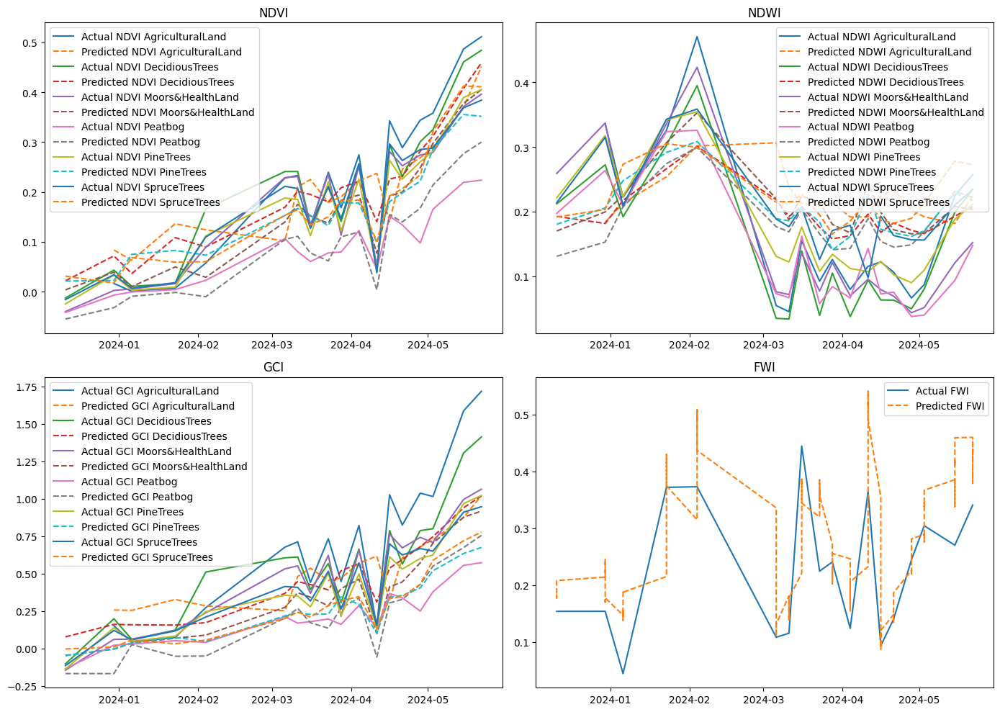

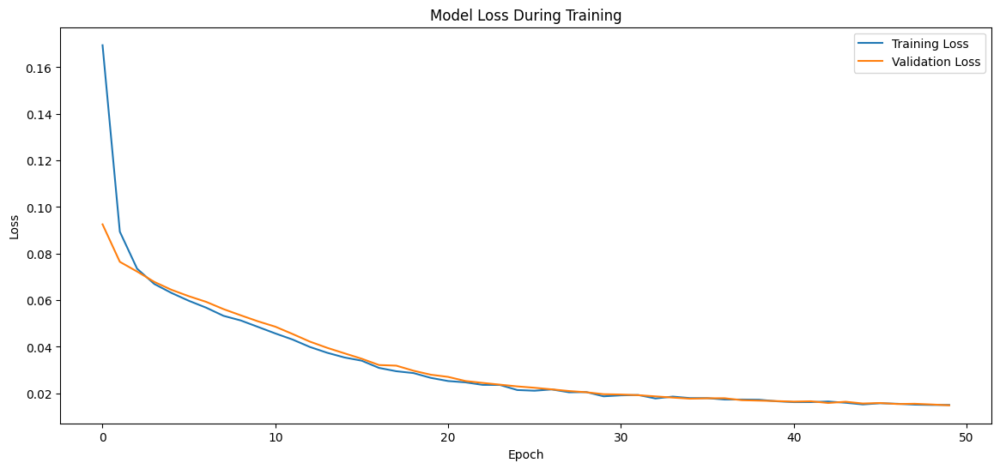

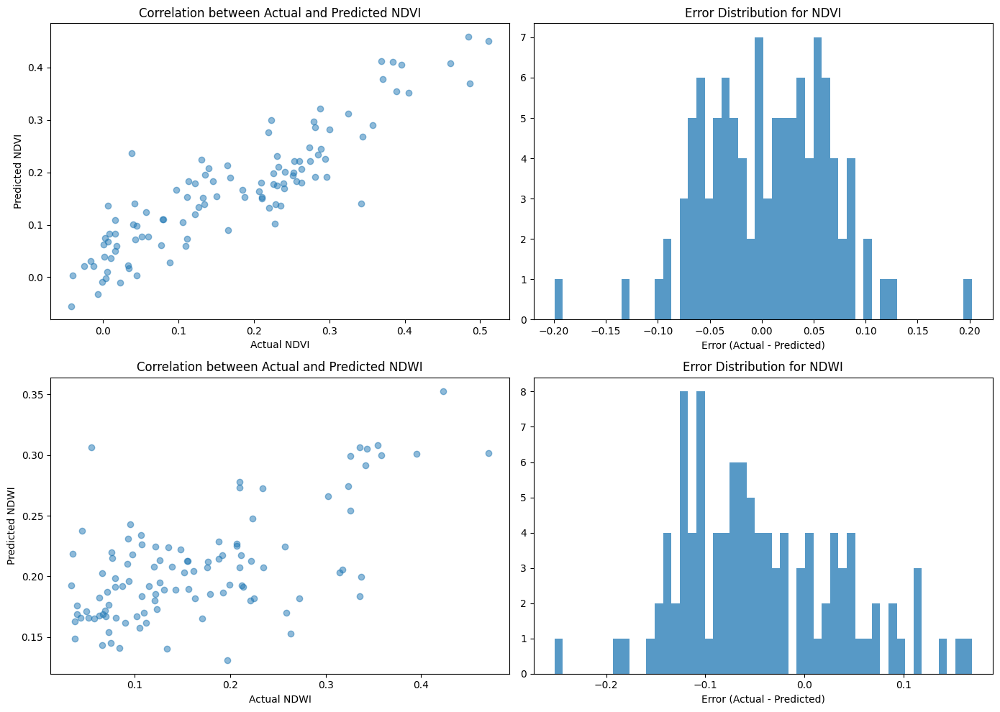

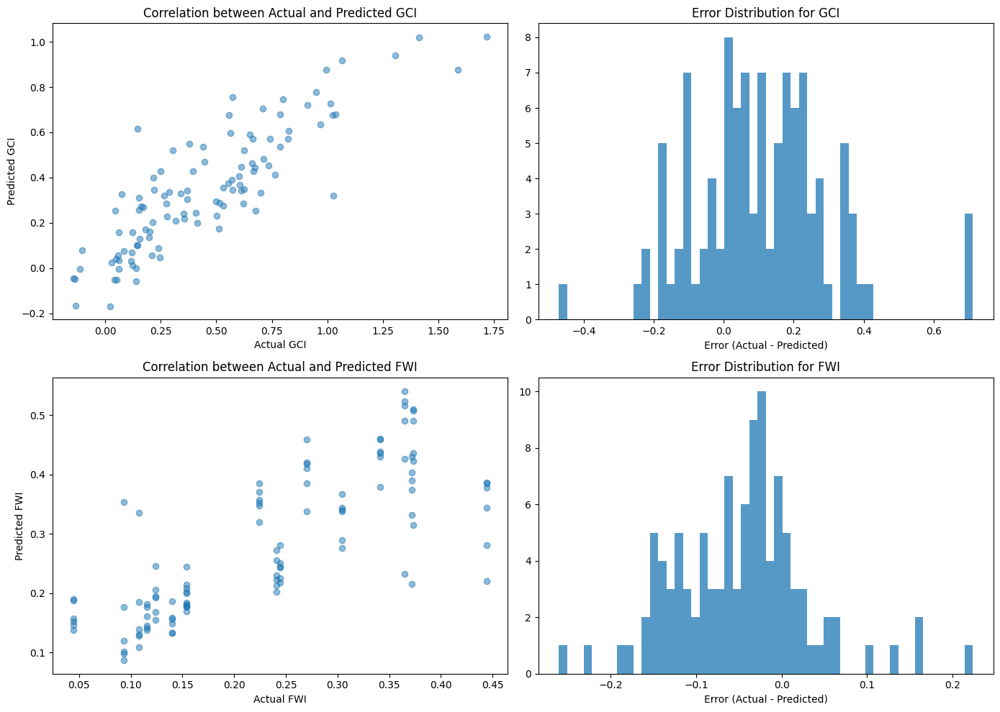

In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Separate FWI for scaling
fwi_scaler = MinMaxScaler()
df['FWI'] = fwi_scaler.fit_transform(df[['FWI']])

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')  # No need to adjust index since we did not drop columns earlier
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


Epoch 1/50
15/15 [==============================] - 1s 19ms/step - loss: 0.1430 - val_loss: 0.0561
Epoch 2/50
15/15 [==============================] - 0s 9ms/step - loss: 0.0583 - val_loss: 0.0533
Epoch 3/50
15/15 [==============================] - 0s 8ms/step - loss: 0.0504 - val_loss: 0.0487
Epoch 4/50
15/15 [==============================] - 0s 8ms/step - loss: 0.0438 - val_loss: 0.0466
Epoch 5/50
15/15 [==============================] - 0s 8ms/step - loss: 0.0401 - val_loss: 0.0438
Epoch 6/50
15/15 [==============================] - 0s 9ms/step - loss: 0.0376 - val_loss: 0.0421
Epoch 7/50
15/15 [==============================] - 0s 11ms/step - loss: 0.0346 - val_loss: 0.0394
Epoch 8/50
15/15 [==============================] - 0s 10ms/step - loss: 0.0339 - val_loss: 0.0375
Epoch 9/50
15/15 [==============================] - 0s 9ms/step - loss: 0.0315 - val_loss: 0.0363
Epoch 10/50
15/15 [==============================] - 0s 9ms/step - loss: 0.0302 - val_loss: 0.0349
Epoch 11/50
15/1

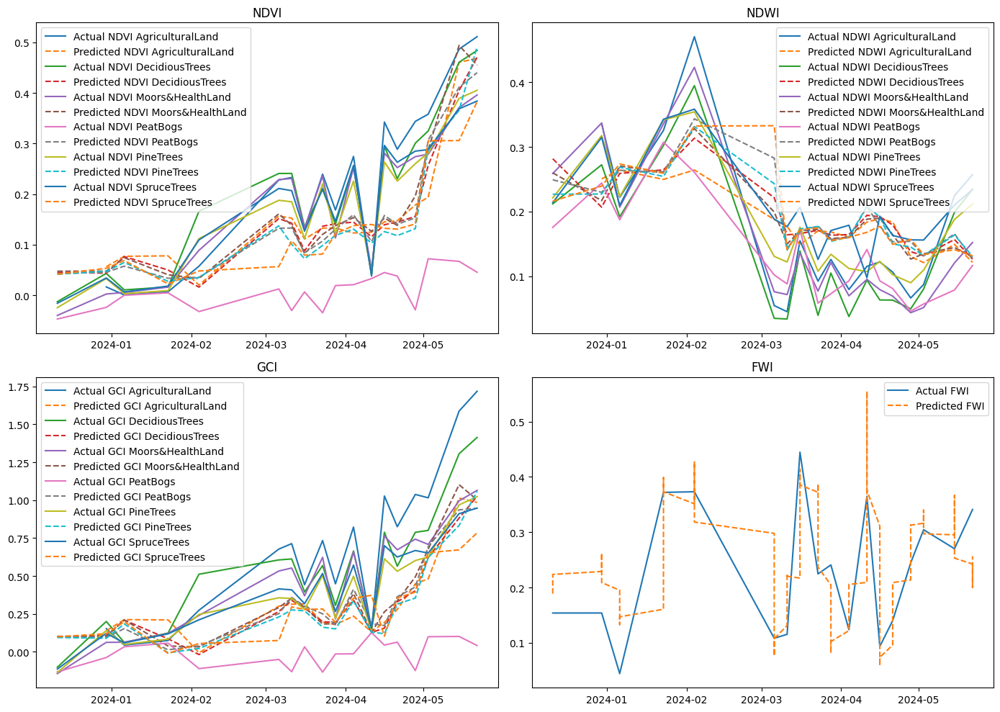

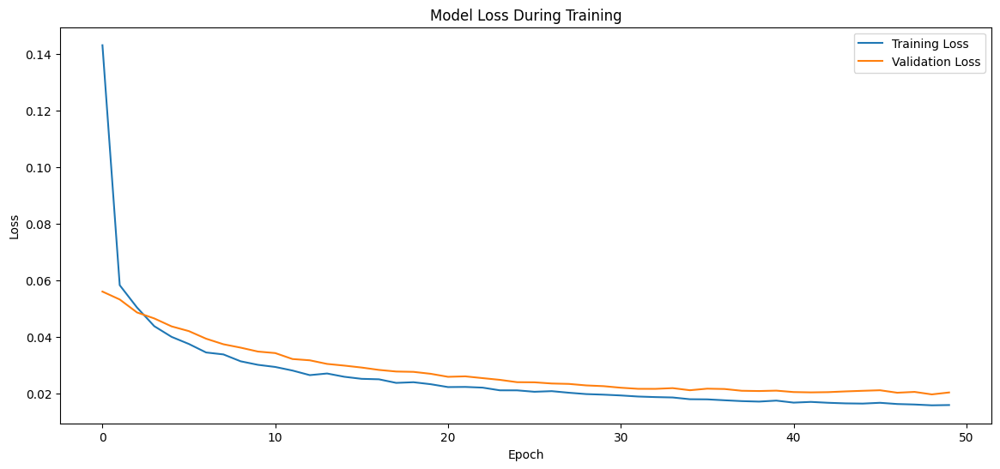

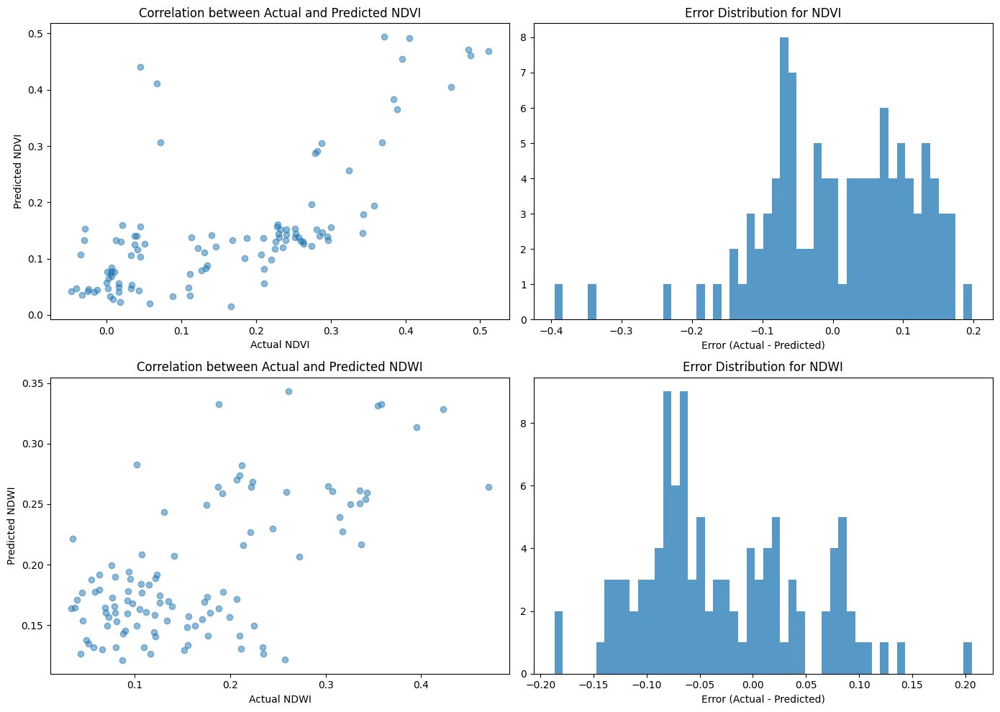

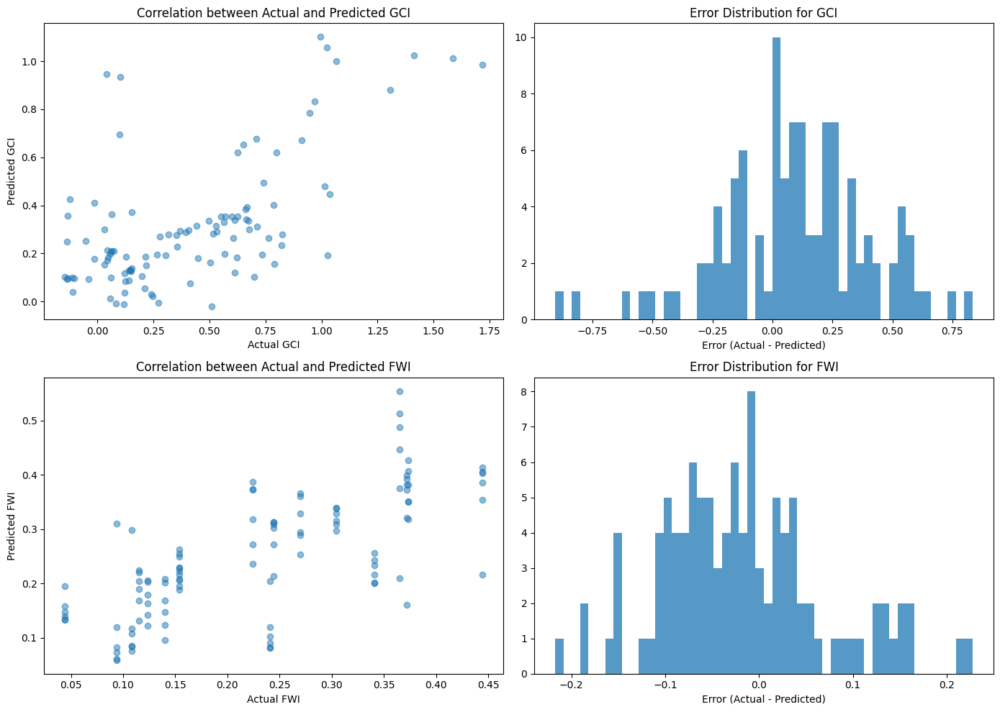

In [160]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('averaged_combined_timeseries.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date
df = df.sort_values('Date')
# Separate FWI for scaling
fwi_scaler = MinMaxScaler()
df['FWI'] = fwi_scaler.fit_transform(df[['FWI']])
# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop(columns=['Date', 'Shapefile']))

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(sequence_length, features)))
model.add(Dropout(0.2))
model.add(Dense(features))
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI') - 2  # Subtract 2 to account for dropped columns 'Date' and 'Shapefile'
ndwi_index = df.columns.get_loc('NDWI') - 2
gci_index = df.columns.get_loc('GCI') - 2
fwi_index = df.columns.get_loc('FWI') - 2

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Remove '.shp' from shapefile names
df['Shapefile'] = df['Shapefile'].str.replace('.shp', '')

# Plot the results with different vegetation types
shapefiles = df['Shapefile'].unique()
dates = df['Date'][train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(df['Shapefile'][train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


## TFT

Epoch 1/50


C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


15/15 [==============================] - 9s 138ms/step - loss: 0.0998 - val_loss: 0.0790
Epoch 2/50
15/15 [==============================] - 1s 55ms/step - loss: 0.0651 - val_loss: 0.0721
Epoch 3/50
15/15 [==============================] - 1s 59ms/step - loss: 0.0584 - val_loss: 0.0668
Epoch 4/50
15/15 [==============================] - 1s 55ms/step - loss: 0.0523 - val_loss: 0.0645
Epoch 5/50
15/15 [==============================] - 1s 58ms/step - loss: 0.0521 - val_loss: 0.0628
Epoch 6/50
15/15 [==============================] - 1s 61ms/step - loss: 0.0490 - val_loss: 0.0585
Epoch 7/50
15/15 [==============================] - 1s 55ms/step - loss: 0.0452 - val_loss: 0.0635
Epoch 8/50
15/15 [==============================] - 1s 59ms/step - loss: 0.0457 - val_loss: 0.0527
Epoch 9/50
15/15 [==============================] - 1s 56ms/step - loss: 0.0411 - val_loss: 0.0491
Epoch 10/50
15/15 [==============================] - 1s 51ms/step - loss: 0.0353 - val_loss: 0.0443
Epoch 11/50
15/15 [

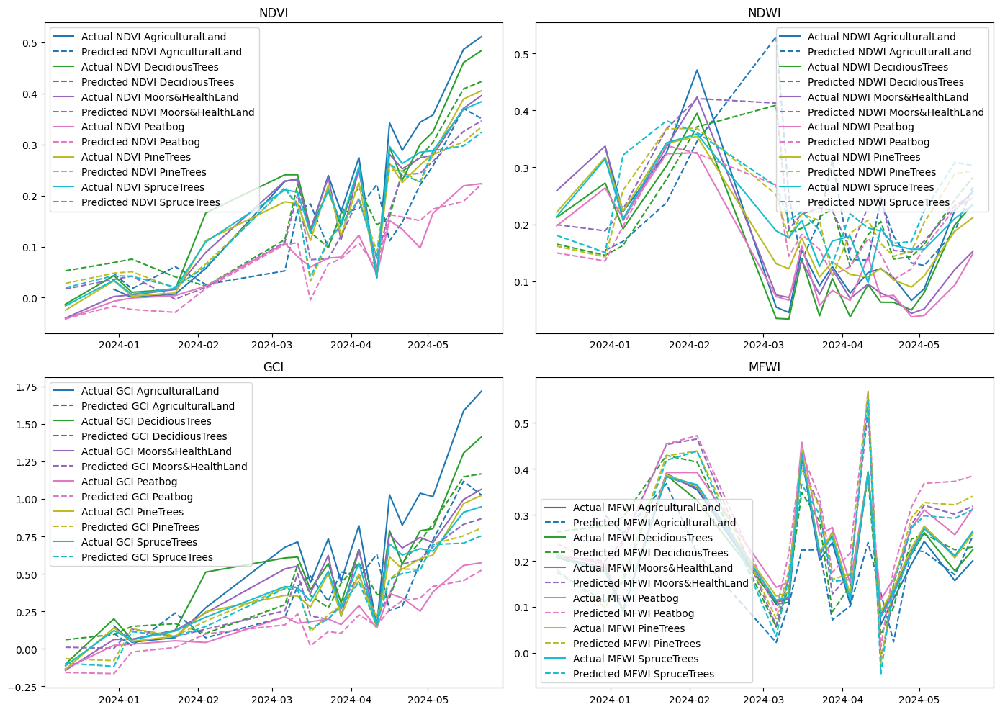

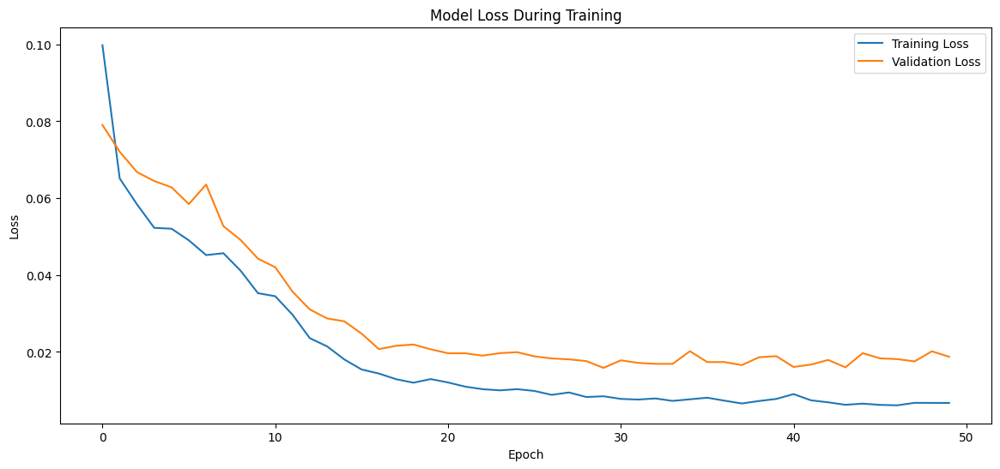

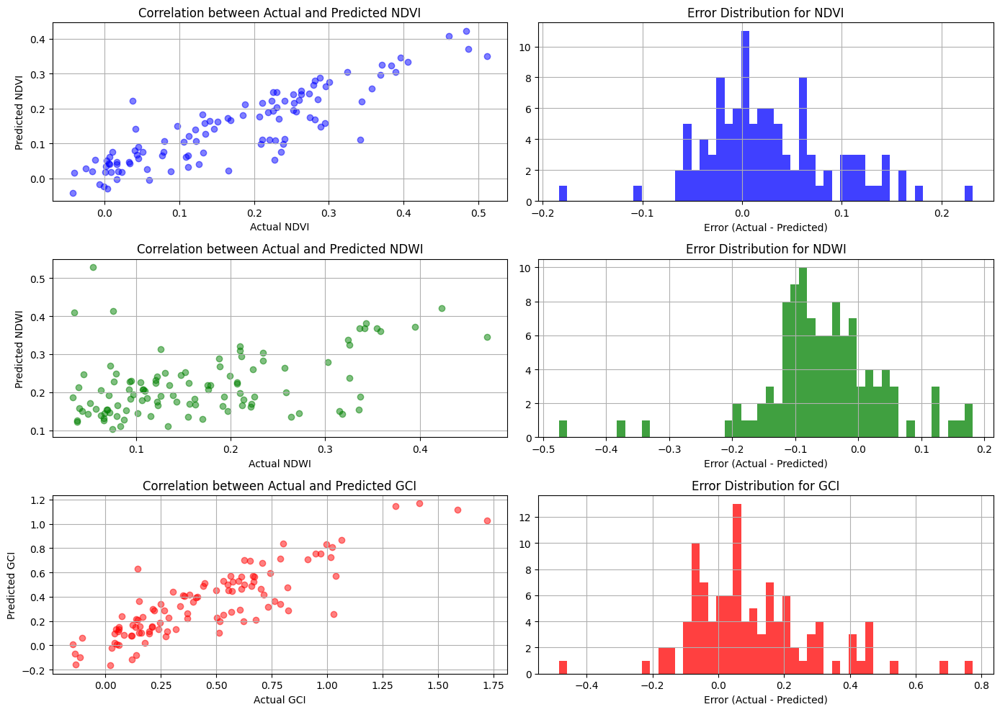

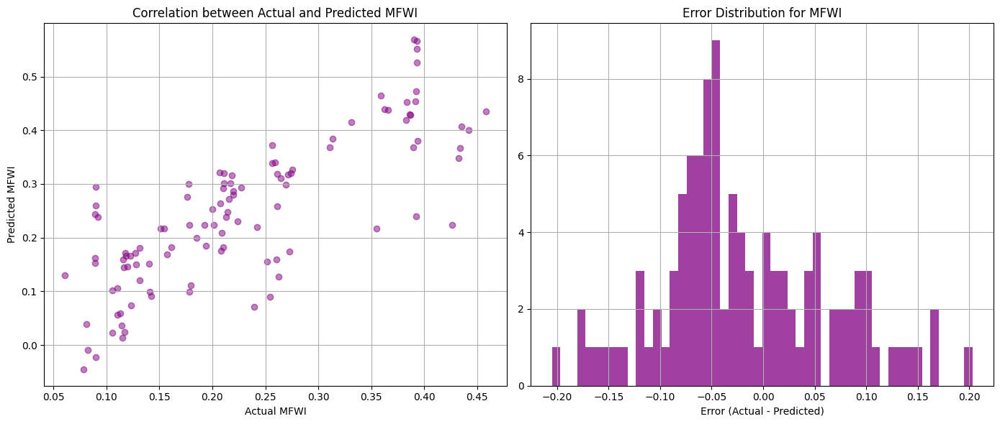

In [27]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Separate MFWI for scaling
mfwi_scaler = MinMaxScaler()
df['MFWI'] = mfwi_scaler.fit_transform(df[['MFWI']])

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = tf.keras.preprocessing.sequence.TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = tf.keras.preprocessing.sequence.TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Define the TFT model
class TemporalFusionTransformer(tf.keras.Model):
    def __init__(self, num_features, num_outputs, seq_length, **kwargs):
        super(TemporalFusionTransformer, self).__init__(**kwargs)
        self.seq_length = seq_length
        self.num_features = num_features
        self.num_outputs = num_outputs
        self.lstm_encoder = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))
        self.lstm_decoder = tf.keras.layers.LSTM(128, return_sequences=True)
        self.attention = tfa.layers.MultiHeadAttention(num_heads=4, head_size=64)
        self.dense = tf.keras.layers.Dense(num_outputs)

    def call(self, inputs):
        # Encoder
        encoder_output = self.lstm_encoder(inputs)
        
        # Decoder
        decoder_output = self.lstm_decoder(encoder_output)
        
        # Attention
        attention_output = self.attention([decoder_output, decoder_output, decoder_output])
        
        # Dense layer
        output = self.dense(attention_output)
        
        return output[:, -1, :]  # We only return the last time step prediction

# Build the model
model = TemporalFusionTransformer(num_features=features, num_outputs=features, seq_length=sequence_length)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, FWI, and MFWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')
mfwi_index = df.columns.get_loc('MFWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]
predicted_mfwi = predictions[:, mfwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]
actual_mfwi = actual[:, mfwi_index]

# Define colors for each vegetation type
colors = plt.cm.tab10(np.linspace(0, 1, len(shapefiles)))

# Plot the results with different vegetation types for MFWI
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_mfwi[shapefile_indices], label=f'Actual MFWI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_mfwi[shapefile_indices], linestyle='--', label=f'Predicted MFWI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('MFWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(3, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5, color='blue')
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75, color='blue')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')
plt.grid(True)

plt.subplot(3, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5, color='green')
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')
plt.grid(True)

plt.subplot(3, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75, color='green')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')
plt.grid(True)

plt.subplot(3, 2, 5)
plt.scatter(actual_gci, predicted_gci, alpha=0.5, color='red')
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')
plt.grid(True)

plt.subplot(3, 2, 6)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75, color='red')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')
plt.grid(True)

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for MFWI
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.scatter(actual_mfwi, predicted_mfwi, alpha=0.5, color='purple')
plt.xlabel('Actual MFWI')
plt.ylabel('Predicted MFWI')
plt.title('Correlation between Actual and Predicted MFWI')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.hist(actual_mfwi - predicted_mfwi, bins=50, alpha=0.75, color='purple')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for MFWI')
plt.grid(True)

plt.tight_layout()
plt.show()


Epoch 1/50


C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\initializers\initializers.py:120: UserWarning:

The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.



15/15 [==============================] - 6s 149ms/step - loss: 0.1095 - val_loss: 0.0780
Epoch 2/50
15/15 [==============================] - 0s 32ms/step - loss: 0.0658 - val_loss: 0.0800
Epoch 3/50
15/15 [==============================] - 1s 39ms/step - loss: 0.0601 - val_loss: 0.0738
Epoch 4/50
15/15 [==============================] - 1s 57ms/step - loss: 0.0552 - val_loss: 0.0689
Epoch 5/50
15/15 [==============================] - 1s 33ms/step - loss: 0.0532 - val_loss: 0.0677
Epoch 6/50
15/15 [==============================] - 0s 31ms/step - loss: 0.0501 - val_loss: 0.0624
Epoch 7/50
15/15 [==============================] - 0s 30ms/step - loss: 0.0472 - val_loss: 0.0561
Epoch 8/50
15/15 [==============================] - 1s 37ms/step - loss: 0.0424 - val_loss: 0.0545
Epoch 9/50
15/15 [==============================] - 1s 45ms/step - loss: 0.0397 - val_loss: 0.0501
Epoch 10/50
15/15 [==============================] - 0s 32ms/step - loss: 0.0353 - val_loss: 0.0444
Epoch 11/50
15/15 [

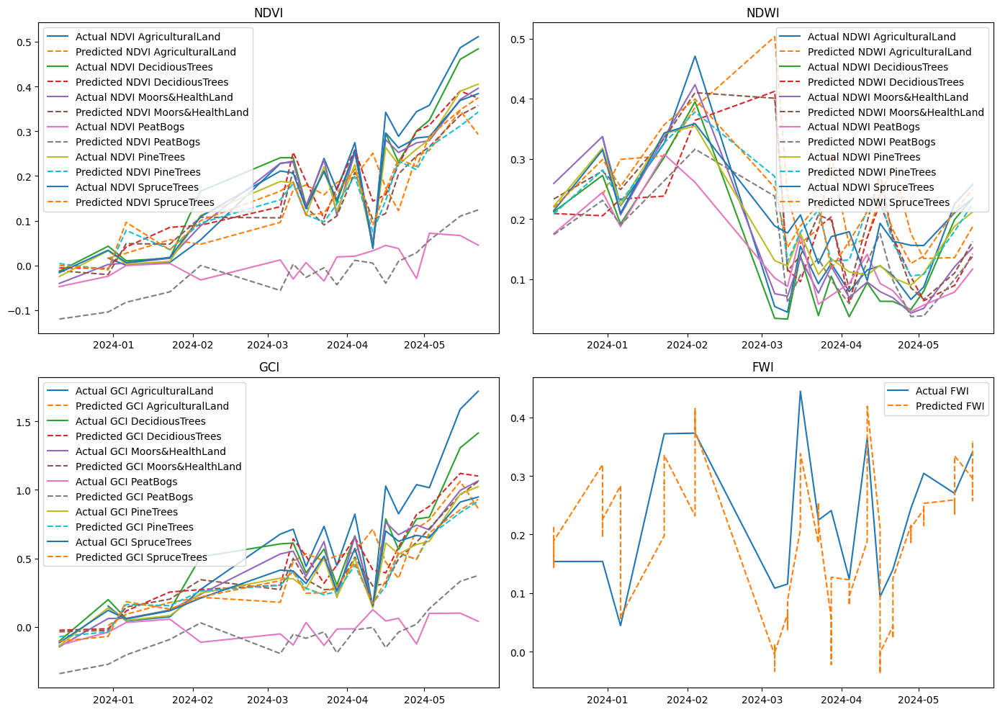

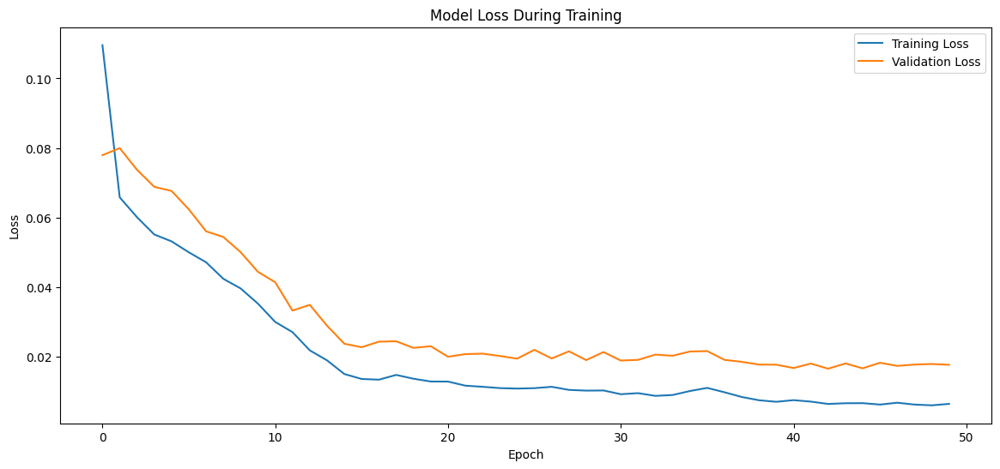

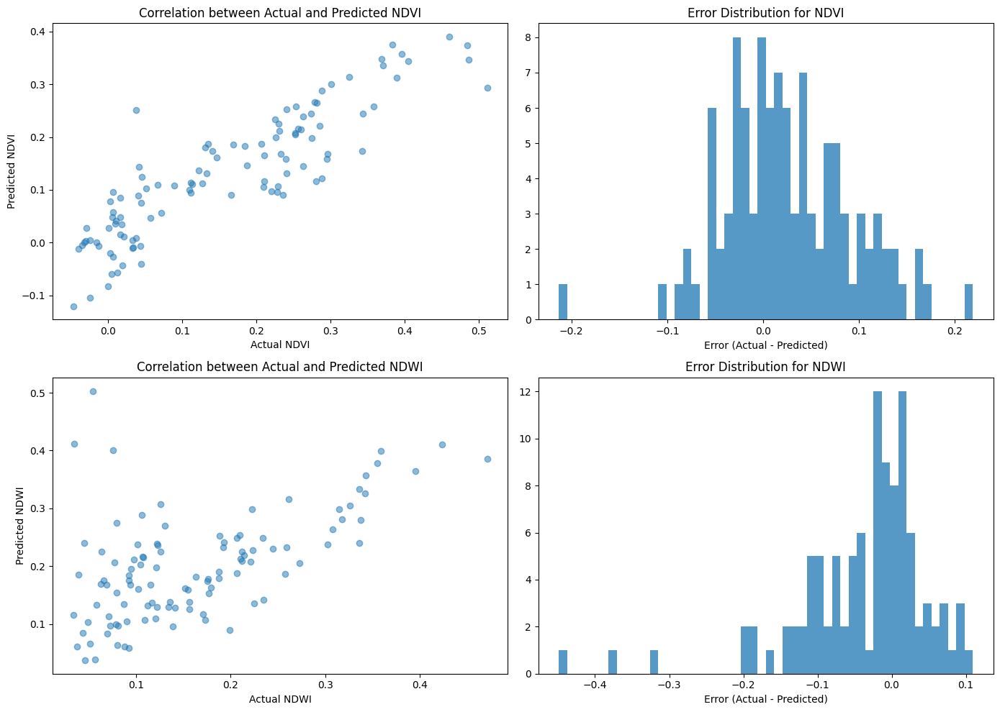

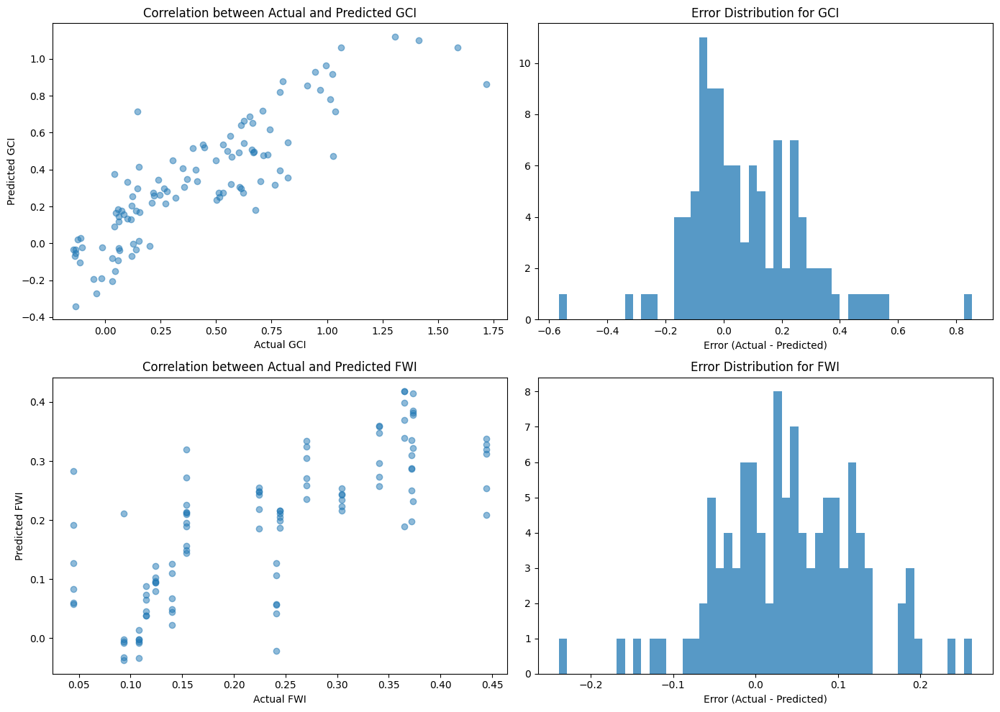

In [164]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Separate FWI for scaling
fwi_scaler = MinMaxScaler()
df['FWI'] = fwi_scaler.fit_transform(df[['FWI']])

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Define the TFT model
class TemporalFusionTransformer(tf.keras.Model):
    def __init__(self, num_features, num_outputs, seq_length, **kwargs):
        super(TemporalFusionTransformer, self).__init__(**kwargs)
        self.seq_length = seq_length
        self.num_features = num_features
        self.num_outputs = num_outputs
        self.lstm_encoder = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))
        self.lstm_decoder = tf.keras.layers.LSTM(128, return_sequences=True)
        self.attention = tfa.layers.MultiHeadAttention(num_heads=4, head_size=64)
        self.dense = tf.keras.layers.Dense(num_outputs)

    def call(self, inputs):
        # Encoder
        encoder_output = self.lstm_encoder(inputs)
        
        # Decoder
        decoder_output = self.lstm_decoder(encoder_output)
        
        # Attention
        attention_output = self.attention([decoder_output, decoder_output, decoder_output])
        
        # Dense layer
        output = self.dense(attention_output)
        
        return output[:, -1, :]  # We only return the last time step prediction

# Build the model
model = TemporalFusionTransformer(num_features=features, num_outputs=features, seq_length=sequence_length)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')  # No need to adjust index since we did not drop columns earlier
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')

plt.tight_layout()
plt.show()


## MAMBA


Epoch 1/50
15/15 [==============================] - 3s 36ms/step - loss: 0.1871 - val_loss: 0.1230
Epoch 2/50
15/15 [==============================] - 0s 17ms/step - loss: 0.1062 - val_loss: 0.0851
Epoch 3/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0707 - val_loss: 0.0757
Epoch 4/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0615 - val_loss: 0.0745
Epoch 5/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0592 - val_loss: 0.0714
Epoch 6/50
15/15 [==============================] - 0s 13ms/step - loss: 0.0578 - val_loss: 0.0704
Epoch 7/50
15/15 [==============================] - 0s 13ms/step - loss: 0.0555 - val_loss: 0.0696
Epoch 8/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0522 - val_loss: 0.0664
Epoch 9/50
15/15 [==============================] - 0s 15ms/step - loss: 0.0490 - val_loss: 0.0639
Epoch 10/50
15/15 [==============================] - 0s 14ms/step - loss: 0.0452 - val_loss: 0.0576
Epoch 11/

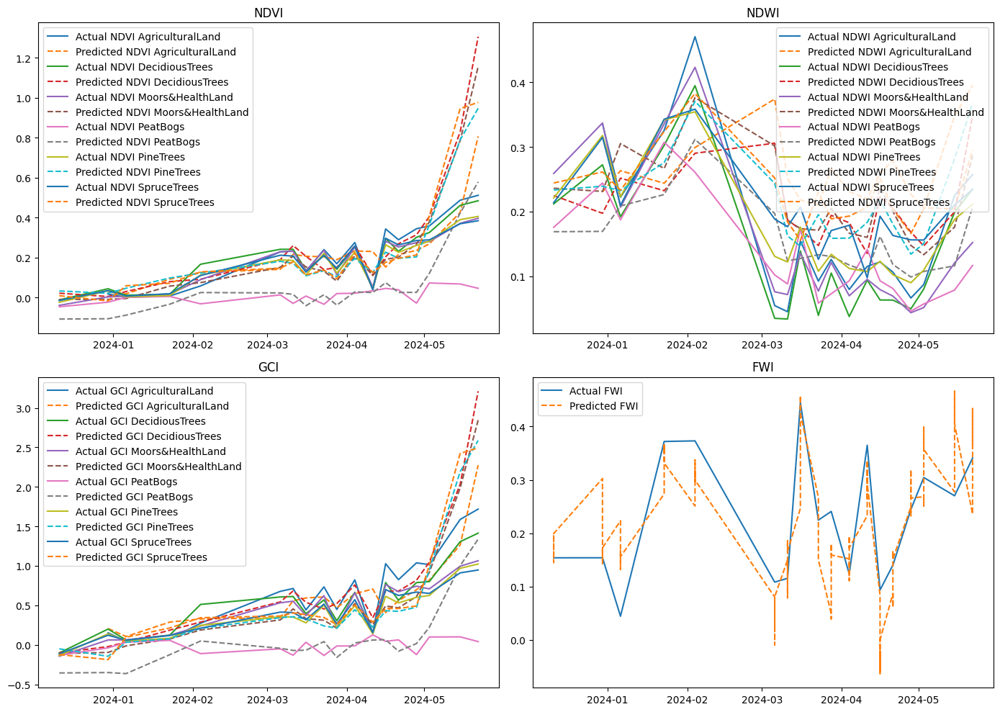

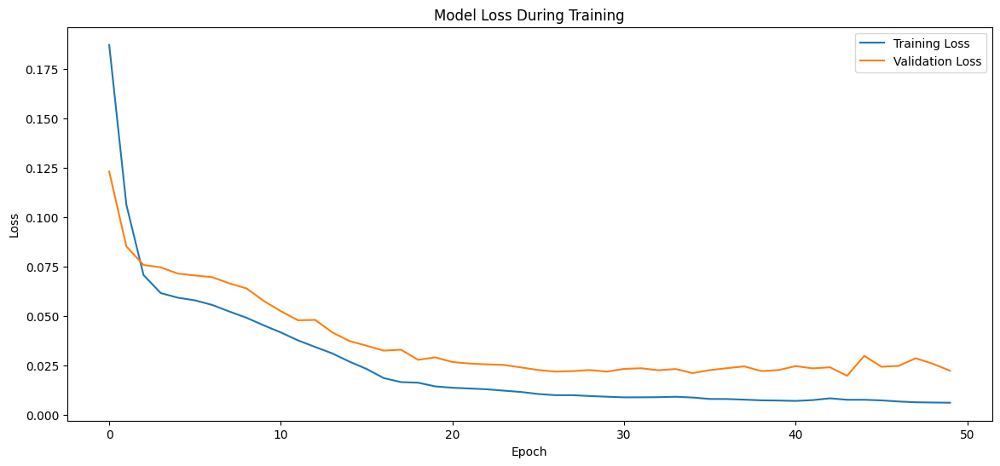

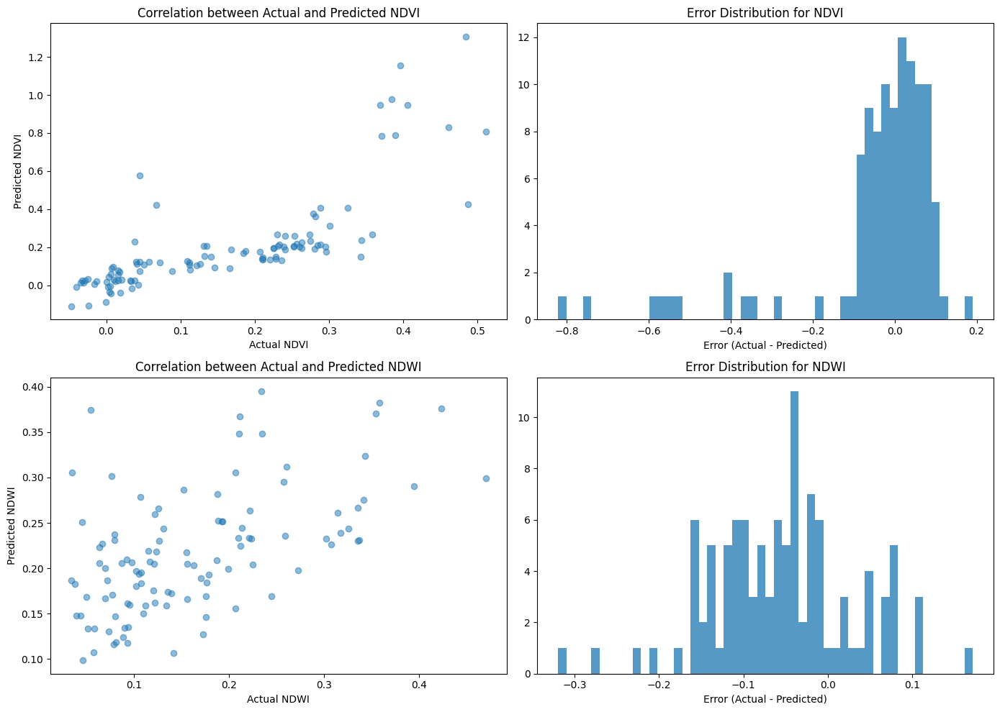

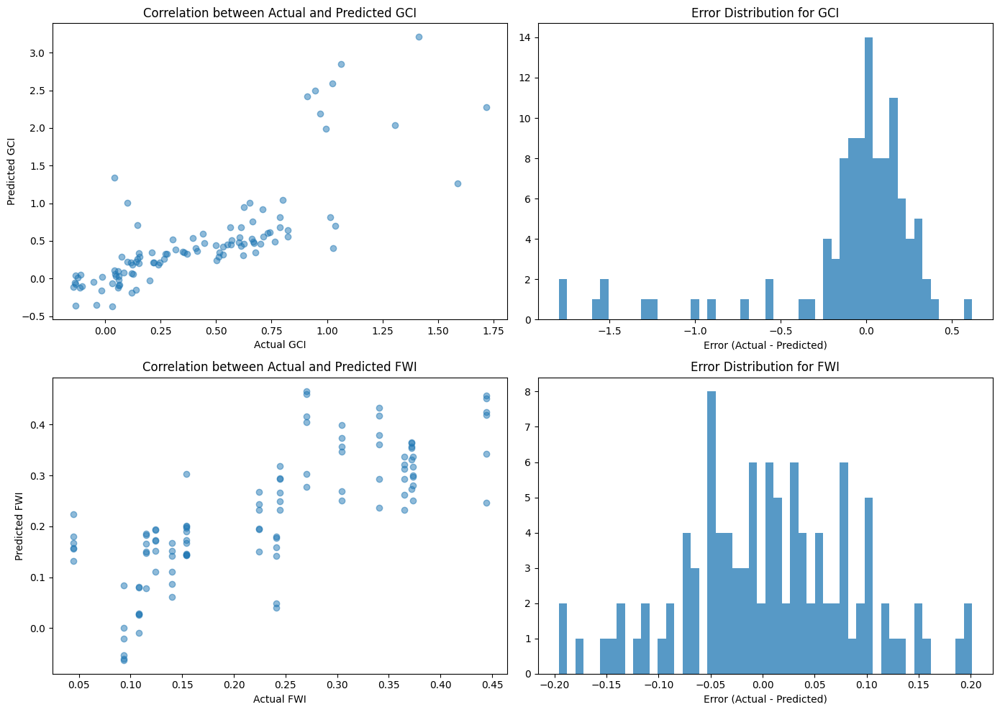

In [163]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Bidirectional, Layer
import matplotlib.pyplot as plt
import tensorflow as tf

# Define the Attention Layer
class Attention(Layer):
    def __init__(self, **kwargs):
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight', shape=(input_shape[-1], input_shape[-1]), initializer='glorot_uniform', trainable=True)
        self.b = self.add_weight(name='attention_bias', shape=(input_shape[-1],), initializer='zeros', trainable=True)
        super(Attention, self).build(input_shape)

    def call(self, x):
        e = tf.keras.backend.tanh(tf.keras.backend.dot(x, self.W) + self.b)
        a = tf.keras.backend.softmax(e, axis=1)
        output = x * a
        return tf.keras.backend.sum(output, axis=1)

# Define the Mamba model architecture
def Mamba(input_shape, output_dim):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(100, activation='relu', return_sequences=True))(inputs)
    x = LSTM(50, activation='relu', return_sequences=True)(x)
    x = Attention()(x)
    outputs = Dense(output_dim)(x)
    model = Model(inputs, outputs)
    return model

# Load and preprocess the data
df = pd.read_csv('averaged_combined_timeseries.csv')
df['Date'] = pd.to_datetime(df['Date'])
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month
shapefile_encoded = pd.get_dummies(df['Shapefile'])
shapefile_column = df['Shapefile']
date_column = df['Date']
df = pd.concat([df, shapefile_encoded], axis=1)
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Separate FWI for scaling
fwi_scaler = MinMaxScaler()
df['FWI'] = fwi_scaler.fit_transform(df[['FWI']])
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Build and train the Mamba model
input_shape = (sequence_length, features)
output_dim = features
model = Mamba(input_shape, output_dim)
model.compile(optimizer='adam', loss='mse')
history = model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, and FWI
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')
predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]
actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]

# Calculate additional metrics
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)
mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)
mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)
mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Print results in table format
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi]
})
print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for shapefile in shapefiles:
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
plt.plot(dates, actual_fwi, label='Actual FWI')
plt.plot(dates, predicted_fwi, linestyle='--', label='Predicted FWI')
plt.legend()
plt.title('FWI')
plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')

plt.subplot(2, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')

plt.subplot(2, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')

plt.subplot(2, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')
plt.tight_layout()
plt.show()

# Plot correlation and error distribution for GCI and FWI
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
plt.scatter(actual_gci, predicted_gci, alpha=0.5)
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')

plt.subplot(2, 2, 2)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')

plt.subplot(2, 2, 3)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')

plt.subplot(2, 2, 4)
plt.hist(actual_fwi - predicted_fwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for FWI')
plt.tight_layout()
plt.show()


# xLSTM

Epoch 1/350
15/15 [==============================] - 6s 105ms/step - loss: 0.2407 - val_loss: 0.0970
Epoch 2/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0762 - val_loss: 0.0893
Epoch 3/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0620 - val_loss: 0.0704
Epoch 4/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0525 - val_loss: 0.0649
Epoch 5/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0487 - val_loss: 0.0604
Epoch 6/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0461 - val_loss: 0.0582
Epoch 7/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0431 - val_loss: 0.0538
Epoch 8/350
15/15 [==============================] - 1s 37ms/step - loss: 0.0412 - val_loss: 0.0525
Epoch 9/350
15/15 [==============================] - 0s 31ms/step - loss: 0.0393 - val_loss: 0.0509
Epoch 10/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0385 - val_loss: 0.049

15/15 [==============================] - 0s 26ms/step - loss: 0.0040 - val_loss: 0.0111
Epoch 163/350
15/15 [==============================] - 0s 26ms/step - loss: 0.0042 - val_loss: 0.0096
Epoch 164/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0041 - val_loss: 0.0098
Epoch 165/350
15/15 [==============================] - 0s 27ms/step - loss: 0.0039 - val_loss: 0.0101
Epoch 166/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0037 - val_loss: 0.0096
Epoch 167/350
15/15 [==============================] - 0s 26ms/step - loss: 0.0035 - val_loss: 0.0097
Epoch 168/350
15/15 [==============================] - 0s 30ms/step - loss: 0.0035 - val_loss: 0.0102
Epoch 169/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0036 - val_loss: 0.0106
Epoch 170/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0035 - val_loss: 0.0099
Epoch 171/350
15/15 [==============================] - 0s 26ms/step - loss: 0.0035 - val_loss: 0

15/15 [==============================] - 0s 28ms/step - loss: 0.0027 - val_loss: 0.0154
Epoch 323/350
15/15 [==============================] - 0s 27ms/step - loss: 0.0033 - val_loss: 0.0160
Epoch 324/350
15/15 [==============================] - 0s 27ms/step - loss: 0.0037 - val_loss: 0.0139
Epoch 325/350
15/15 [==============================] - 0s 26ms/step - loss: 0.0032 - val_loss: 0.0132
Epoch 326/350
15/15 [==============================] - 0s 31ms/step - loss: 0.0047 - val_loss: 0.0163
Epoch 327/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0046 - val_loss: 0.0146
Epoch 328/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0033 - val_loss: 0.0139
Epoch 329/350
15/15 [==============================] - 0s 31ms/step - loss: 0.0042 - val_loss: 0.0132
Epoch 330/350
15/15 [==============================] - 0s 29ms/step - loss: 0.0035 - val_loss: 0.0163
Epoch 331/350
15/15 [==============================] - 0s 28ms/step - loss: 0.0030 - val_loss: 0

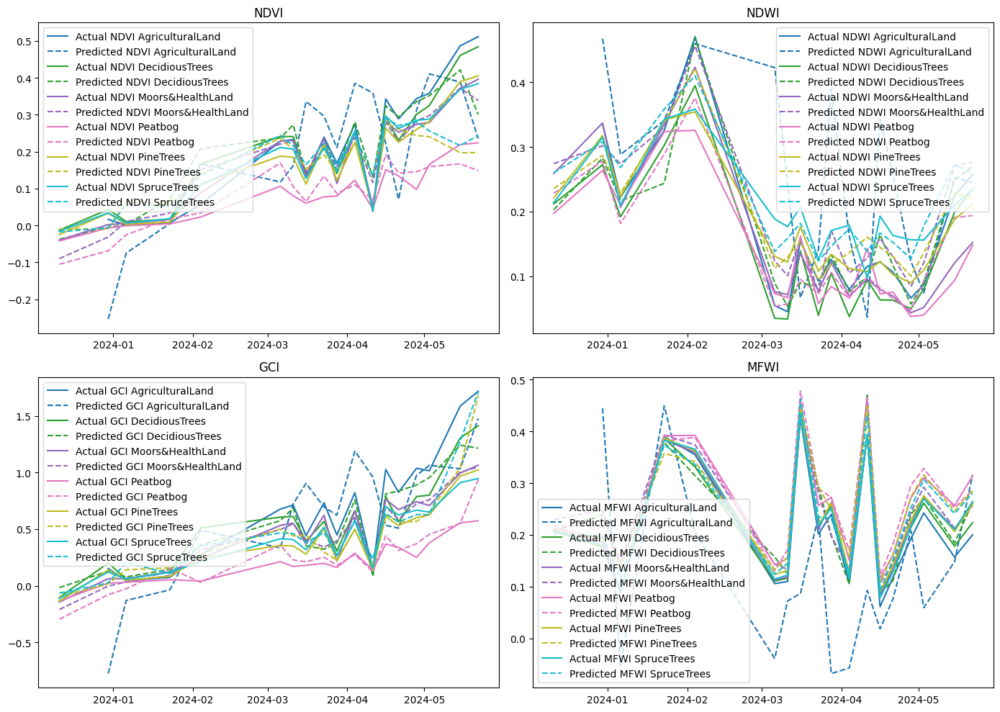

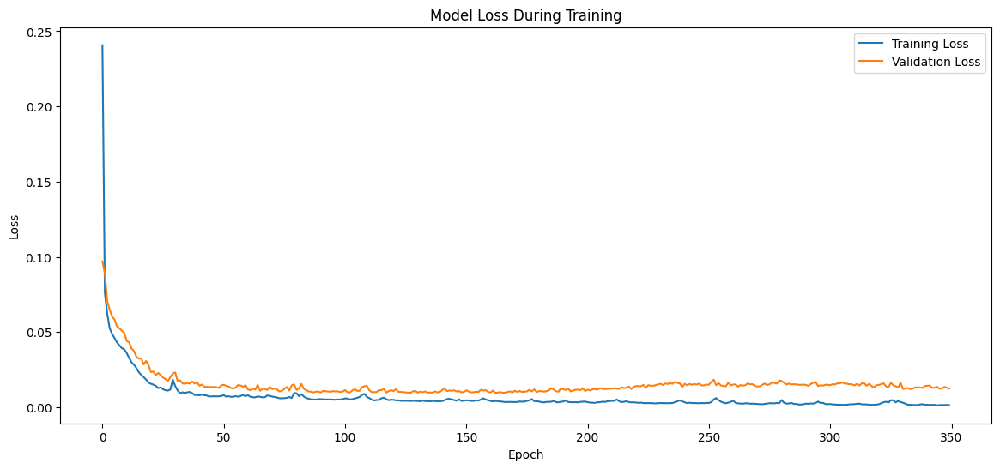

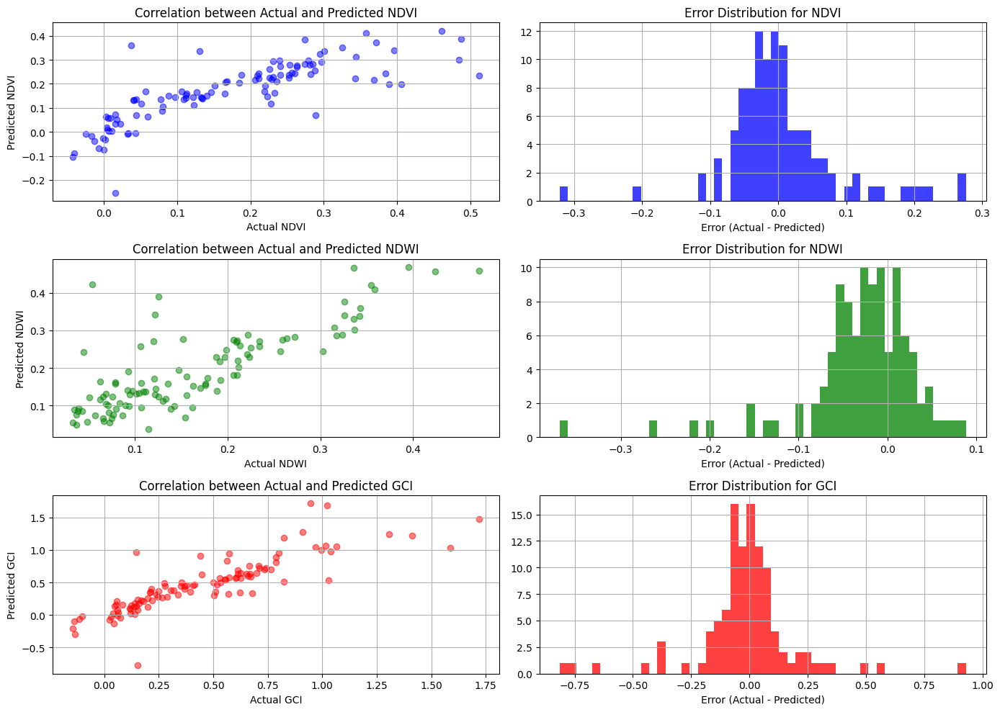

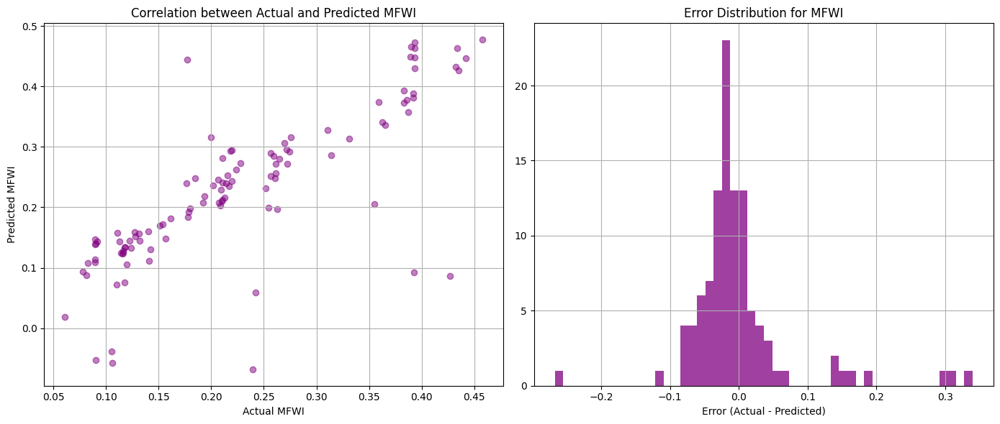

In [49]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'])

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Separate MFWI for scaling
mfwi_scaler = MinMaxScaler()
df['MFWI'] = mfwi_scaler.fit_transform(df[['MFWI']])

# Normalize the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = tf.keras.preprocessing.sequence.TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = tf.keras.preprocessing.sequence.TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Define the XLSTM model
class XLSTM(tf.keras.Model):
    def __init__(self, num_features, num_outputs, seq_length, **kwargs):
        super(XLSTM, self).__init__(**kwargs)
        self.seq_length = seq_length
        self.num_features = num_features
        self.num_outputs = num_outputs
        self.lstm_layers = [tf.keras.layers.LSTM(128, return_sequences=True) for _ in range(2)]
        self.dense = tf.keras.layers.Dense(num_outputs)
        self.layer_norm = tf.keras.layers.LayerNormalization()

    def call(self, inputs):
        x = inputs
        for lstm in self.lstm_layers:
            x = lstm(x)
            x = self.layer_norm(x)
        output = self.dense(x)
        return output[:, -1, :]  # We only return the last time step prediction

# Build the model
model = XLSTM(num_features=features, num_outputs=features, seq_length=sequence_length)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(train_generator, epochs=350, validation_data=test_generator)

# Make predictions
predictions = model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, FWI, and MFWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')
mfwi_index = df.columns.get_loc('MFWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]
predicted_mfwi = predictions[:, mfwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]
actual_mfwi = actual[:, mfwi_index]

# Define colors for each vegetation type
colors = plt.cm.tab10(np.linspace(0, 1, len(shapefiles)))

# Plot the results with different vegetation types for MFWI
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('NDVI')

plt.subplot(2, 2, 2)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('NDWI')

plt.subplot(2, 2, 3)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('GCI')

plt.subplot(2, 2, 4)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_mfwi[shapefile_indices], label=f'Actual MFWI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.plot(dates.iloc[shapefile_indices], predicted_mfwi[shapefile_indices], linestyle='--', label=f'Predicted MFWI {shapefile.replace(".shp", "")}', color=colors[i])
plt.legend()
plt.title('MFWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot correlation and error distribution
plt.figure(figsize=(14, 10))

plt.subplot(3, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5, color='blue')
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75, color='blue')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')
plt.grid(True)

plt.subplot(3, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5, color='green')
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')
plt.grid(True)

plt.subplot(3, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75, color='green')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')
plt.grid(True)

plt.subplot(3, 2, 5)
plt.scatter(actual_gci, predicted_gci, alpha=0.5, color='red')
plt.xlabel('Actual GCI')
plt.ylabel('Predicted GCI')
plt.title('Correlation between Actual and Predicted GCI')
plt.grid(True)

plt.subplot(3, 2, 6)
plt.hist(actual_gci - predicted_gci, bins=50, alpha=0.75, color='red')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for GCI')
plt.grid(True)

plt.tight_layout()
plt.show()

# Plot correlation and error distribution for MFWI
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.scatter(actual_mfwi, predicted_mfwi, alpha=0.5, color='purple')
plt.xlabel('Actual MFWI')
plt.ylabel('Predicted MFWI')
plt.title('Correlation between Actual and Predicted MFWI')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.hist(actual_mfwi - predicted_mfwi, bins=50, alpha=0.75, color='purple')
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for MFWI')
plt.grid(True)

plt.tight_layout()
plt.show()


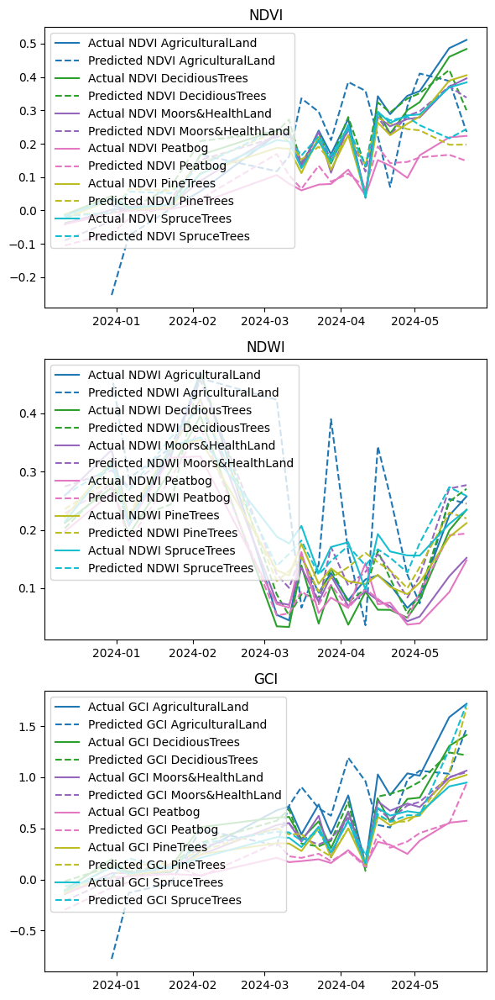

PDF saved with NDVI, NDWI, and GCI predictions.


In [50]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np

# Define colors for each vegetation type
colors = plt.cm.tab10(np.linspace(0, 1, len(shapefiles)))

# Create a PDF to save the plots
with PdfPages('NDVI_NDWI_GCI_Predictions.pdf') as pdf:

    # Plot the results with different vegetation types for NDVI, NDWI, and GCI
    plt.figure(figsize=(6, 12))

    # Plot NDVI
    plt.subplot(3, 1, 1)
    for i, shapefile in enumerate(shapefiles):
        shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
        plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], label=f'Actual NDVI {shapefile.replace(".shp", "")}', color=colors[i])
        plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', label=f'Predicted NDVI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.legend()
    plt.title('NDVI')

    # Plot NDWI
    plt.subplot(3, 1, 2)
    for i, shapefile in enumerate(shapefiles):
        shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
        plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], label=f'Actual NDWI {shapefile.replace(".shp", "")}', color=colors[i])
        plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', label=f'Predicted NDWI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.legend()
    plt.title('NDWI')

    # Plot GCI
    plt.subplot(3, 1, 3)
    for i, shapefile in enumerate(shapefiles):
        shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
        plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], label=f'Actual GCI {shapefile.replace(".shp", "")}', color=colors[i])
        plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', label=f'Predicted GCI {shapefile.replace(".shp", "")}', color=colors[i])
    plt.legend()
    plt.title('GCI')

    # Adjust layout
    plt.tight_layout()

    # Save the figure to the PDF
    pdf.savefig()

    # Show the plot (optional, can be removed if saving directly to PDF is sufficient)
    plt.show()

print("PDF saved with NDVI, NDWI, and GCI predictions.")


AttenXLSTM

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input, Layer
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Calculate Modified FWI (MFWI)
alpha, beta, gamma = 0.1, 0.1, 0.1
df['MFWI'] = df['FWI'] * (1 / (1 + alpha * df['NDVI'])) * (1 / (1 + beta * df['NDWI'])) * (1 / (1 + gamma * df['GCI']))

# Extract date features
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Month'] = df['Date'].dt.month

# One-hot encode the shapefile column
shapefile_encoded = pd.get_dummies(df['Shapefile'], prefix='Shapefile')

# Keep a copy of the original Shapefile and Date columns for later use
shapefile_column = df['Shapefile']
date_column = df['Date']

# Concatenate the original dataframe with the new features
df = pd.concat([df, shapefile_encoded], axis=1)

# Drop the original Date and Shapefile columns
df.drop(columns=['Date', 'Shapefile'], inplace=True)

# Ensure all data is numeric
df = df.apply(pd.to_numeric, errors='coerce')

# Separate FWI and MFWI for scaling
fwi_scaler = MinMaxScaler()
df[['FWI', 'MFWI']] = fwi_scaler.fit_transform(df[['FWI', 'MFWI']])

# Normalize the remaining data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Define sequence length and batch size
sequence_length = 10
batch_size = 32
features = scaled_data.shape[1]

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create sequences
train_generator = TimeseriesGenerator(train_data, train_data, length=sequence_length, batch_size=batch_size)
test_generator = TimeseriesGenerator(test_data, test_data, length=sequence_length, batch_size=batch_size)

# Define Attention Layer
class Attention(Layer):
    def __init__(self):
        super(Attention, self).__init__()
        
    def build(self, input_shape):
        self.W = self.add_weight(name="att_weight", shape=(input_shape[-1], input_shape[-1]), initializer="glorot_uniform", trainable=True)
        self.b = self.add_weight(name="att_bias", shape=(input_shape[-1],), initializer="zeros", trainable=True)
        self.u = self.add_weight(name="att_u", shape=(input_shape[-1],), initializer="glorot_uniform", trainable=True)
        super(Attention, self).build(input_shape)
        
    def call(self, inputs):
        score = K.tanh(K.dot(inputs, self.W) + self.b)
        score = K.dot(score, self.u)
        attention_weights = K.softmax(score, axis=1)
        context_vector = attention_weights * inputs
        context_vector = K.sum(context_vector, axis=1)
        
        return context_vector, attention_weights

# Build the Attention-Enhanced LSTM model
input_layer = Input(shape=(sequence_length, features))
lstm_out = LSTM(100, activation='relu', return_sequences=True)(input_layer)
context_vector, attention_weights = Attention()(lstm_out)
dropout = Dropout(0.2)(context_vector)
output_layer = Dense(features)(dropout)

# Compile the model
att_lstm_model = Model(inputs=input_layer, outputs=output_layer)
att_lstm_model.compile(optimizer='adam', loss='mse')

# Train the model
history = att_lstm_model.fit(train_generator, epochs=50, validation_data=test_generator)

# Make predictions
predictions, _ = att_lstm_model.predict(test_generator)

# Prepare actual values from the test generator
actual = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])

# Inverse transform the predictions and the actual values to get them back to the original scale
predictions = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(actual)

# Extract NDVI, NDWI, GCI, FWI, and MFWI from predictions and actual values
ndvi_index = df.columns.get_loc('NDVI')
ndwi_index = df.columns.get_loc('NDWI')
gci_index = df.columns.get_loc('GCI')
fwi_index = df.columns.get_loc('FWI')
mfwi_index = df.columns.get_loc('MFWI')

predicted_ndvi = predictions[:, ndvi_index]
predicted_ndwi = predictions[:, ndwi_index]
predicted_gci = predictions[:, gci_index]
predicted_fwi = predictions[:, fwi_index]
predicted_mfwi = predictions[:, mfwi_index]

actual_ndvi = actual[:, ndvi_index]
actual_ndwi = actual[:, ndwi_index]
actual_gci = actual[:, gci_index]
actual_fwi = actual[:, fwi_index]
actual_mfwi = actual[:, mfwi_index]

# Calculate additional metrics for MFWI
mae_mfwi = mean_absolute_error(actual_mfwi, predicted_mfwi)
rmse_mfwi = mean_squared_error(actual_mfwi, predicted_mfwi, squared=False)
mape_mfwi = mean_absolute_percentage_error(actual_mfwi, predicted_mfwi)

# Calculate metrics for NDVI, NDWI, GCI, FWI
mae_ndvi = mean_absolute_error(actual_ndvi, predicted_ndvi)
rmse_ndvi = mean_squared_error(actual_ndvi, predicted_ndvi, squared=False)
mape_ndvi = mean_absolute_percentage_error(actual_ndvi, predicted_ndvi)

mae_ndwi = mean_absolute_error(actual_ndwi, predicted_ndwi)
rmse_ndwi = mean_squared_error(actual_ndwi, predicted_ndwi, squared=False)
mape_ndwi = mean_absolute_percentage_error(actual_ndwi, predicted_ndwi)

mae_gci = mean_absolute_error(actual_gci, predicted_gci)
rmse_gci = mean_squared_error(actual_gci, predicted_gci, squared=False)
mape_gci = mean_absolute_percentage_error(actual_gci, predicted_gci)

mae_fwi = mean_absolute_error(actual_fwi, predicted_fwi)
rmse_fwi = mean_squared_error(actual_fwi, predicted_fwi, squared=False)
mape_fwi = mean_absolute_percentage_error(actual_fwi, predicted_fwi)

# Update results DataFrame
results = pd.DataFrame({
    'Metric': ['MAE', 'RMSE', 'MAPE'],
    'NDVI': [mae_ndvi, rmse_ndvi, mape_ndvi],
    'NDWI': [mae_ndwi, rmse_ndwi, mape_ndwi],
    'GCI': [mae_gci, rmse_gci, mape_gci],
    'FWI': [mae_fwi, rmse_fwi, mape_fwi],
    'MFWI': [mae_mfwi, rmse_mfwi, mape_mfwi]
})

print(results)

# Plot the results with different vegetation types
shapefiles = shapefile_column.unique()
dates = date_column[train_size + sequence_length:].reset_index(drop=True)

plt.figure(figsize=(14, 12))
colors = plt.cm.get_cmap('tab10', len(shapefiles))

plt.subplot(3, 2, 1)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndvi[shapefile_indices], color=colors(i), label=f'Actual NDVI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndvi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted NDVI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDVI')

plt.subplot(3, 2, 2)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_ndwi[shapefile_indices], color=colors(i), label=f'Actual NDWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_ndwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted NDWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('NDWI')

plt.subplot(3, 2, 3)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_gci[shapefile_indices], color=colors(i), label=f'Actual GCI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_gci[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted GCI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('GCI')

plt.subplot(3, 2, 4)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_fwi[shapefile_indices], color=colors(i), label=f'Actual FWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_fwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted FWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('FWI')

plt.subplot(3, 2, 5)
for i, shapefile in enumerate(shapefiles):
    shapefile_indices = np.where(shapefile_column[train_size + sequence_length:].values == shapefile)[0]
    plt.plot(dates.iloc[shapefile_indices], actual_mfwi[shapefile_indices], color=colors(i), label=f'Actual MFWI {shapefile.replace(".shp", "")}')
    plt.plot(dates.iloc[shapefile_indices], predicted_mfwi[shapefile_indices], linestyle='--', color=colors(i), label=f'Predicted MFWI {shapefile.replace(".shp", "")}')
plt.legend()
plt.title('MFWI')

plt.tight_layout()
plt.show()

# Visualization of model accuracy
plt.figure(figsize=(14, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot correlation and error distribution for MFWI
plt.figure(figsize=(14, 10))

plt.subplot(3, 2, 1)
plt.scatter(actual_ndvi, predicted_ndvi, alpha=0.5)
plt.xlabel('Actual NDVI')
plt.ylabel('Predicted NDVI')
plt.title('Correlation between Actual and Predicted NDVI')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.hist(actual_ndvi - predicted_ndvi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDVI')
plt.grid(True)

plt.subplot(3, 2, 3)
plt.scatter(actual_ndwi, predicted_ndwi, alpha=0.5)
plt.xlabel('Actual NDWI')
plt.ylabel('Predicted NDWI')
plt.title('Correlation between Actual and Predicted NDWI')
plt.grid(True)

plt.subplot(3, 2, 4)
plt.hist(actual_ndwi - predicted_ndwi, bins=50, alpha=0.75)
plt.xlabel('Error (Actual - Predicted)')
plt.title('Error Distribution for NDWI')
plt.grid(True)

plt.subplot(3, 2, 5)
plt.scatter(actual_fwi, predicted_fwi, alpha=0.5)
plt.xlabel('Actual FWI')
plt.ylabel('Predicted FWI')
plt.title('Correlation between Actual and Predicted FWI')
plt.grid(True)

plt.subplot(3, 2, 6)
plt.scatter(actual_mfwi, predicted_mfwi, alpha=0.5)
plt.xlabel('Actual MFWI')
plt.ylabel('Predicted MFWI')
plt.title('Correlation between Actual and Predicted MFWI')
plt.grid(True)

plt.tight_layout()
plt.show()


StagingError: Exception encountered when calling layer "attention" (type Attention).

in user code:

    File "C:\Users\HVL-301981\AppData\Local\Temp\ipykernel_31948\1248566512.py", line 76, in call  *
        score = K.dot(score, self.u)
    File "C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\backend.py", line 2454, in dot
        y_permute_dim = [y_permute_dim.pop(-2)] + y_permute_dim

    IndexError: pop index out of range


Call arguments received by layer "attention" (type Attention):
  • inputs=tf.Tensor(shape=(None, 10, 100), dtype=float32)

In [39]:
import geemap
import ee
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors

# Initialize the Earth Engine module.
ee.Initialize()

# Load the combined dataset with MFWI
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Define the most recent date available in your dataset to display the latest MFWI values.
latest_date = df['Date'].max()

# Filter the DataFrame to get the latest MFWI values for each shapefile (vegetation type)
latest_mfwi_df = df[df['Date'] == latest_date]

# Map to visualize MFWI
Map = geemap.Map(center=[61.341610554206824, 5.1331657324192514], zoom=13)

# Define a colormap for MFWI (Low risk to high risk)
cmap = plt.get_cmap('RdYlGn_r')  # Reverse of RdYlGn so that green is low risk and red is high risk
norm = Normalize(vmin=float(latest_mfwi_df['MFWI'].min()), vmax=float(latest_mfwi_df['MFWI'].max()))

# Add each shapefile to the map with color corresponding to MFWI
for i, row in latest_mfwi_df.iterrows():
    shapefile_name = row['Shapefile']
    mfwi_value = row['MFWI']
    
    # Load the corresponding shapefile from Google Earth Engine
    shapefile_fc = geemap.shp_to_ee(f'Shapefiles/{shapefile_name}')
    
    # Define the color based on the MFWI value
    mfwi_color = cmap(norm(mfwi_value))
    mfwi_color_hex = mcolors.to_hex(mfwi_color)  # Convert to hex
    
    # Style the feature collection
    styled_fc = shapefile_fc.style(color=mfwi_color_hex, width=1, fillColor=mfwi_color_hex)
    
    # Add the styled feature collection to the map
    Map.addLayer(styled_fc, {}, f'MFWI: {shapefile_name.replace(".shp", "")}')

# Add a colorbar manually using the Normalize and ScalarMappable objects
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Set an empty array for the mappable

# Add a colorbar using the matplotlib's colorbar function
Map.add_colorbar(vis_params={'min': float(latest_mfwi_df['MFWI'].min()), 'max': float(latest_mfwi_df['MFWI'].max())}, cmap='RdYlGn_r', label='MFWI')

# Display the map
Map.addLayerControl()  # This is required for the layer control to display
Map


Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.


Map(center=[61.341610554206824, 5.1331657324192514], controls=(WidgetControl(options=['position', 'transparent…

In [38]:
import geemap
import ee
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, ScalarMappable
import matplotlib.colors as mcolors

# Initialize the Earth Engine module.
ee.Initialize()

# Load the combined dataset with MFWI
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Filter the dataset to only include dates between January 1st and May 31st
df_filtered = df[(df['Date'] >= '2024-01-01') & (df['Date'] <= '2024-05-31')]

# Get the unique dates in the filtered DataFrame
unique_dates = df_filtered['Date'].dt.strftime('%Y-%m-%d').unique()

# Loop through each unique date and display the map
for date in unique_dates:
    # Filter the DataFrame for the current date
    current_date_df = df_filtered[df_filtered['Date'] == date]
    
    # Create a new map with a fixed center and zoom level
    Map = geemap.Map(center=[61.341610554206824, 5.1331657324192514], zoom=13)

    # Define a colormap for MFWI (Low risk to high risk)
    cmap = plt.get_cmap('RdYlGn_r')  # Reverse of RdYlGn so that green is low risk and red is high risk
    norm = Normalize(vmin=float(df_filtered['MFWI'].min()), vmax=float(df_filtered['MFWI'].max()))

    # Add each shapefile to the map with color corresponding to MFWI
    for i, row in current_date_df.iterrows():
        shapefile_name = row['Shapefile']
        mfwi_value = row['MFWI']
        
        # Load the corresponding shapefile from Google Earth Engine
        shapefile_fc = geemap.shp_to_ee(f'Shapefiles/{shapefile_name}')
        
        # Define the color based on the MFWI value
        mfwi_color = cmap(norm(mfwi_value))
        mfwi_color_hex = mcolors.to_hex(mfwi_color)  # Convert to hex
        
        # Style the feature collection
        styled_fc = shapefile_fc.style(color=mfwi_color_hex, width=1, fillColor=mfwi_color_hex)
        
        # Add the styled feature collection to the map
        Map.addLayer(styled_fc, {}, f'MFWI: {shapefile_name.replace(".shp", "")}')
    
    # Add a colorbar manually using the Normalize and ScalarMappable objects
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Set an empty array for the mappable
    
    # Add a colorbar using the matplotlib's colorbar function
    Map.add_colorbar(vis_params={'min': float(df_filtered['MFWI'].min()), 'max': float(df_filtered['MFWI'].max())}, cmap='RdYlGn_r', label='MFWI')
    
    # Add the date as a text overlay on the map
    Map.add_text(text=f"Date: {date}", position='topright', font_size=20, font_color='white')
    
    # Display the map
    Map.addLayerControl()  # This is required for the layer control to display
    display(Map)
    
    # Pause to allow for screenshot capture
    input(f"Press Enter to continue to the next map for {date}...")


ImportError: cannot import name 'ScalarMappable' from 'matplotlib.colors' (C:\Users\HVL-301981\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\colors.py)

In [25]:
import geemap
import ee
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors
import os
import imageio
# Initialize the Earth Engine module.
ee.Initialize()

# Load the combined dataset with MFWI
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Filter the dataset to only include dates between June 1, 2022, and May 31, 2024
df = df[(df['Date'] >= '2022-06-01') & (df['Date'] <= '2024-05-31')]

# Define the region of interest (ROI)
roi = ee.Geometry.Polygon([
    [
        [5.04206248483348, 61.35607472166703],
        [5.04206248483348, 61.33225476996233],
        [5.109305201814948, 61.33225476996233],
        [5.109305201814948, 61.35607472166703],
        [5.04206248483348, 61.35607472166703]
    ]
])

# Directory to save HTML files
output_dir = 'MFWI_Images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Generate and save HTML files for each date
for date in df['Date'].dt.strftime('%Y-%m-%d').unique():
    current_date_df = df[df['Date'] == date]

    # Create a new map
    Map = geemap.Map(center=[61.341610554206824, 5.1331657324192514], zoom=13)

    # Define a colormap for MFWI
    cmap = plt.get_cmap('RdYlGn_r')
    norm = Normalize(vmin=float(df['MFWI'].min()), vmax=float(df['MFWI'].max()))

    # Add each shapefile to the map with color corresponding to MFWI
    for i, row in current_date_df.iterrows():
        shapefile_name = row['Shapefile']
        mfwi_value = row['MFWI']

        # Load the corresponding shapefile from Google Earth Engine
        shapefile_fc = geemap.shp_to_ee(f'Shapefiles/{shapefile_name}')

        # Define the color based on the MFWI value
        mfwi_color = cmap(norm(mfwi_value))
        mfwi_color_hex = mcolors.to_hex(mfwi_color)  # Convert to hex

        # Style the feature collection
        styled_fc = shapefile_fc.style(color=mfwi_color_hex, width=1, fillColor=mfwi_color_hex)

        # Add the styled feature collection to the map
        Map.addLayer(styled_fc, {}, f'MFWI: {shapefile_name.replace(".shp", "")}')

    # Add a colorbar
    Map.add_colorbar(vis_params={'min': float(df['MFWI'].min()), 'max': float(df['MFWI'].max())}, cmap='RdYlGn_r', label='MFWI')

    # Add the date as a text overlay on the map
    Map.add_text(text=f"Date: {date}", position='topright', font_size=20, font_color='white')

    # Save the map as an HTML file
    output_html = os.path.join(output_dir, f'MFWI_Map_{date}.html')
    Map.to_html(filename=output_html, title=f"MFWI Map - {date}", width="100%", height="880px")

print("All HTML files have been saved. You can now convert them to PNG images.")


Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but w

Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but w

Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but w

Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but w

Possible issue encountered when converting Shape #1 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.


All HTML files have been saved. You can now convert them to PNG images.


In [16]:
import os
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
import time


# Directory containing the HTML files
html_dir = 'MFWI_Images'
output_dir = 'MFWI_Images_PNG'

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Set up the Selenium WebDriver
options = webdriver.ChromeOptions()
options.add_argument("--headless")  # Ensure GUI is off
options.add_argument("--window-size=1920x1080")
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=options)

# Loop through HTML files and save them as PNG
for file_name in sorted(os.listdir(html_dir)):
    if file_name.endswith('.html'):
        html_file = os.path.join(html_dir, file_name)
        png_file = os.path.join(output_dir, file_name.replace('.html', '.png'))
        
        # Open the HTML file in the browser
        driver.get(f"file://{os.path.abspath(html_file)}")
        time.sleep(5)  # Wait 5 seconds for the map to load
        # Save a screenshot of the opened HTML file
        driver.save_screenshot(png_file)
        print(f"Saved {png_file}")

# Close the driver
driver.quit()


Saved MFWI_Images_PNG\MFWI_Map_2022-06-07.png
Saved MFWI_Images_PNG\MFWI_Map_2022-06-19.png
Saved MFWI_Images_PNG\MFWI_Map_2022-06-26.png
Saved MFWI_Images_PNG\MFWI_Map_2022-07-01.png
Saved MFWI_Images_PNG\MFWI_Map_2022-07-20.png
Saved MFWI_Images_PNG\MFWI_Map_2022-07-27.png
Saved MFWI_Images_PNG\MFWI_Map_2022-08-01.png
Saved MFWI_Images_PNG\MFWI_Map_2022-08-13.png
Saved MFWI_Images_PNG\MFWI_Map_2022-08-20.png
Saved MFWI_Images_PNG\MFWI_Map_2022-08-25.png
Saved MFWI_Images_PNG\MFWI_Map_2022-08-30.png
Saved MFWI_Images_PNG\MFWI_Map_2022-09-01.png
Saved MFWI_Images_PNG\MFWI_Map_2022-09-06.png
Saved MFWI_Images_PNG\MFWI_Map_2022-09-11.png
Saved MFWI_Images_PNG\MFWI_Map_2022-09-18.png
Saved MFWI_Images_PNG\MFWI_Map_2022-09-23.png
Saved MFWI_Images_PNG\MFWI_Map_2022-09-30.png
Saved MFWI_Images_PNG\MFWI_Map_2022-10-07.png
Saved MFWI_Images_PNG\MFWI_Map_2022-10-12.png
Saved MFWI_Images_PNG\MFWI_Map_2022-10-17.png
Saved MFWI_Images_PNG\MFWI_Map_2022-10-19.png
Saved MFWI_Images_PNG\MFWI_Map_202

In [26]:
import imageio

# Combine the saved images into a GIF
images = []
for file_name in sorted(os.listdir(output_dir)):
    if file_name.endswith('.png'):
        file_path = os.path.join(output_dir, file_name)
        images.append(imageio.imread(file_path))

gif_path = os.path.join(output_dir, 'mfwi_timelapse.gif')
imageio.mimsave(gif_path, images, fps=2)

print(f"GIF saved at {gif_path}")


ValueError: need at least one array to stack

In [28]:
import geemap
import ee
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors
import os
import imageio

# Function to generate the colorbar image
def generate_colorbar(cmap_name, vmin, vmax):
    """Generates a colorbar image using matplotlib."""
    cmap = plt.get_cmap(cmap_name)
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # Create a figure and axes for the colorbar
    fig, ax = plt.subplots(figsize=(6, 0.5))
    fig.subplots_adjust(bottom=0.5)

    # Create the colorbar
    cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=ax, orientation='horizontal')
    cbar.set_label('MFWI')
    
    # Save the colorbar to an image
    colorbar_image_path = 'colorbar.png'
    plt.savefig(colorbar_image_path, format='png')
    plt.close(fig)
    
    return colorbar_image_path

# Paths
output_dir = 'MFWI_Images_PNG'
gif_path = 'mfwi_timelapse.gif'
font_path = 'arial.ttf'  # You can specify the path to your font here if needed

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Assuming you already have generated PNG images without date/legend
png_files = sorted([f for f in os.listdir(output_dir) if f.endswith('.png')])

# Generate the colorbar
colorbar_image_path = generate_colorbar('RdYlGn_r', vmin=0, vmax=100)  # Adjust vmin and vmax based on your data

# Process each image to add date and legend
processed_images = []

for i, png_file in enumerate(png_files):
    img_path = os.path.join(output_dir, png_file)
    img = Image.open(img_path).convert("RGBA")
    draw = ImageDraw.Draw(img)
    
    # Add the date
    date_text = png_file.replace('MFWI_Map_', '').replace('.png', '')
    font = ImageFont.truetype(font_path, 30)  # Adjust font size as needed
    draw.text((10, 10), f"Date: {date_text}", font=font, fill="white")
    
    # Add the colorbar (legend)
    colorbar_img = Image.open(colorbar_image_path).convert("RGBA")
    img.paste(colorbar_img, (img.width - colorbar_img.width - 10, img.height - colorbar_img.height - 10), colorbar_img)
    
    # Save the processed image
    processed_images.append(img)

# Create a GIF from the processed images
processed_images[0].save(
    gif_path, save_all=True, append_images=processed_images[1:], duration=1000, loop=0
)

print(f"GIF saved to {gif_path}")


GIF saved to mfwi_timelapse.gif


In [33]:
import os
from PIL import Image, ImageDraw, ImageFont
import imageio
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors

# Function to generate the colorbar image
def generate_colorbar(cmap_name, vmin, vmax):
    """Generates a colorbar image using matplotlib."""
    cmap = plt.get_cmap(cmap_name)
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # Create a figure and axes for the colorbar
    fig, ax = plt.subplots(figsize=(6, 0.5))
    fig.subplots_adjust(bottom=0.5)

    # Create the colorbar
    cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=ax, orientation='horizontal')
    cbar.set_label('MFWI')
    
    # Save the colorbar to an image
    colorbar_image_path = 'colorbar.png'
    plt.savefig(colorbar_image_path, format='png')
    plt.close(fig)
    
    return colorbar_image_path

# Paths
output_dir = 'MFWI_Images_PNG'
gif_path = 'mfwi_timelapse.gif'
font_path = 'arial.ttf'  # You can specify the path to your font here if needed

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Assuming you already have generated PNG images without date/legend
png_files = sorted([f for f in os.listdir(output_dir) if f.endswith('.png')])

# Generate the colorbar
colorbar_image_path = generate_colorbar('RdYlGn_r', vmin=0, vmax=100)  # Adjust vmin and vmax based on your data

# Process each image to add date and legend
processed_images = []

for i, png_file in enumerate(png_files):
    img_path = os.path.join(output_dir, png_file)
    img = Image.open(img_path).convert("RGBA")
    draw = ImageDraw.Draw(img)
    
    # Add the date
    date_text = png_file.replace('MFWI_Map_', '').replace('.png', '')
    font = ImageFont.truetype(font_path, 30)  # Adjust font size as needed
    text_width, text_height = draw.textsize(date_text, font=font)
    date_position = (img.width - int(img.width * 0.11) - text_width, 10)  # 1% from the right edge, top position
    draw.text(date_position, f"Date: {date_text}", font=font, fill="black")
    
    # Add the colorbar (legend)
    colorbar_img = Image.open(colorbar_image_path).convert("RGBA")
    img.paste(colorbar_img, (img.width - colorbar_img.width - 10, img.height - colorbar_img.height - 10), colorbar_img)
    
    # Crop the image: margin on all sides and 10% from the bottom
    top_margin = 10
    bottom_crop = int(img.height * 0.8)
    cropped_img = img.crop((top_margin, top_margin, img.width - top_margin, bottom_crop))
    
    # Save the processed image
    processed_images.append(cropped_img)

# Create a GIF from the processed images
processed_images[0].save(
    gif_path, save_all=True, append_images=processed_images[1:], duration=1000, loop=0
)

print(f"GIF saved to {gif_path}")


GIF saved to mfwi_timelapse.gif


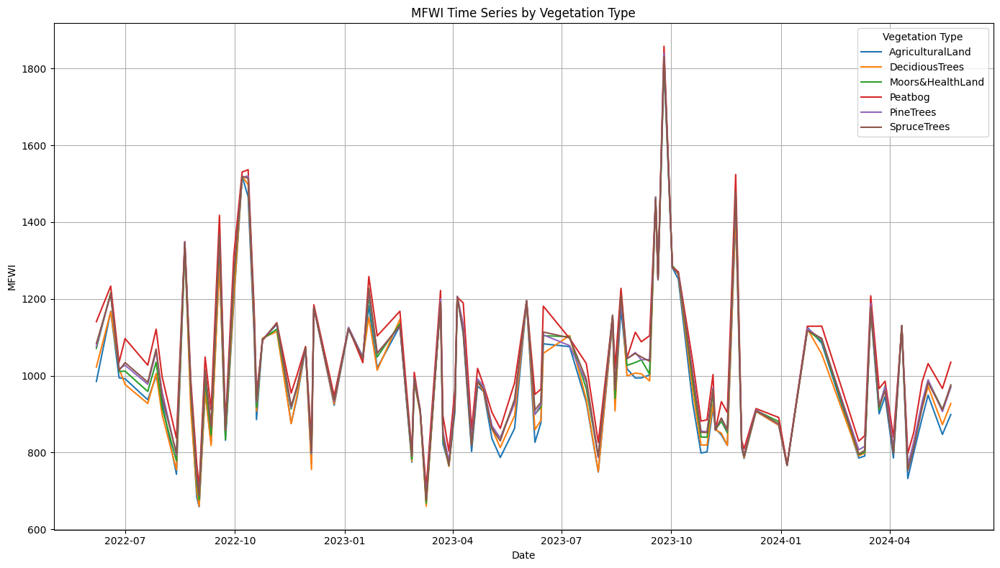

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the combined dataset with MFWI
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Plotting the MFWI time series for each shapefile (vegetation type)
plt.figure(figsize=(14, 8))

shapefiles = df['Shapefile'].unique()
for shapefile in shapefiles:
    shapefile_data = df[df['Shapefile'] == shapefile]
    plt.plot(shapefile_data['Date'], shapefile_data['MFWI'], label=shapefile.replace('.shp', ''))

# Adding titles and labels
plt.title('MFWI Time Series by Vegetation Type')
plt.xlabel('Date')
plt.ylabel('MFWI')
plt.legend(title='Vegetation Type')
plt.grid(True)
plt.tight_layout()

# Display the plot
plt.show()


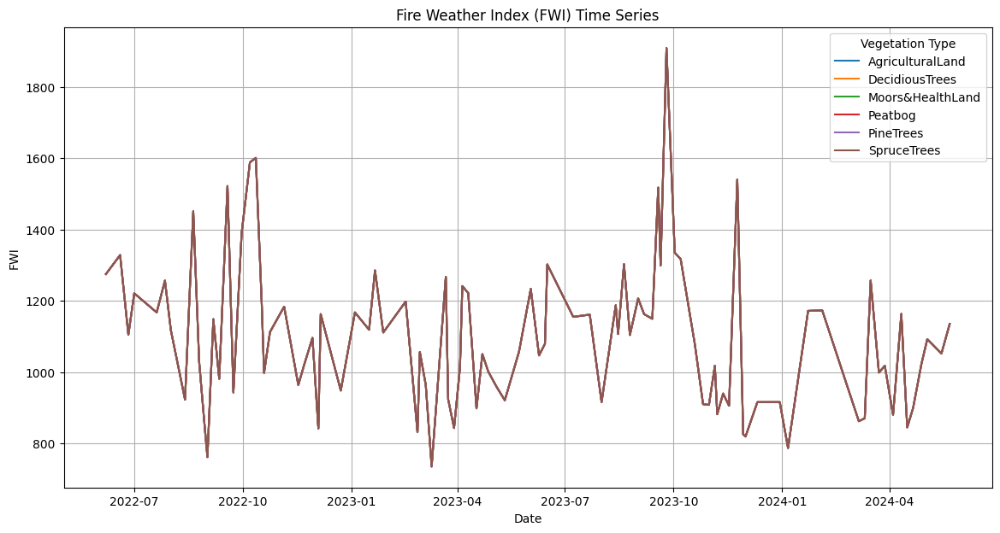

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the combined dataset with FWI
df = pd.read_csv('combined_timeseries_with_modified_FWI.csv')

# Convert 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Plot the FWI time series
plt.figure(figsize=(14, 7))
for shapefile in df['Shapefile'].unique():
    shapefile_df = df[df['Shapefile'] == shapefile]
    plt.plot(shapefile_df['Date'], shapefile_df['FWI'], label=shapefile.replace('.shp', ''))

plt.title('Fire Weather Index (FWI) Time Series')
plt.xlabel('Date')
plt.ylabel('FWI')
plt.legend(title='Vegetation Type')
plt.grid(True)
plt.show()


In [40]:
pip install xlstm



     ---------------------------------------- 0.0/46.4 kB ? eta -:--:--
     ---------------------------------------- 46.4/46.4 kB 2.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/95.3 kB ? eta -:--:--
   ---------------------------------------- 95.3/95.3 kB 2.7 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip
